# Эксперимент №2: расчет характеристик тандемной сети с узлами  PH/PH/1/N по трём моментам с помощью имитационного моделирования и машинного обучения

В этом эксперименте мы рассчитаем различные характеристики сетей с линейной топологией, в которой случайные величины интервалов поступления и времени обслуживания будут задавать фазовыми распределениями. 

Сначала мы рассчитаем характеристики на заданной сетке статистических параметров с помощью имитационного моделирования сети. Аппроксимацию функцию распределения будем проводить по трем моментов с помощью алгоритма [1]. Затем используем полученные результаты для обучения нейросетевых и других моделей ML, которые сможем использовать для очень быстрой оценки характеристик сетей. Например, такой подход полезен при нахождении решений задач оптимизации топологии, когда характеристики сетей с линейной топологией являются ограничениями в алгоритме ветвей и границ. 


[1] Mary A. Johnson & Michael R. Taaffe (1989) Matching moments to phase distributions: Mixtures of erlang distributions of common order, Communications in Statistics. Stochastic Models, 5:4, 711-743, DOI: 10.1080/15326348908807131


In [1]:
import os
from itertools import product
from collections import namedtuple
import time
from typing import Tuple
import random

from tabulate import tabulate
from tqdm.notebook import tqdm
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib import patches
import numpy as np
import pandas as pd

# Подключаем локальные пакеты
from pyqumo.random import Distribution, Exponential, HyperExponential, Erlang
from pyqumo.cqumo.sim import simulate_tandem


from pyqumo.fitting.johnson89 import fit_mern2
from pyqumo.stats import get_cv, get_skewness, get_noncentral_m2, get_noncentral_m3
from pyqumo.random import HyperErlang

# Поключаем пакеты для ML
import math
from sklearn.metrics import r2_score, mean_squared_error, precision_score, recall_score, f1_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LinearRegression, LogisticRegression
from catboost import CatBoostClassifier
import tensorflow as tf
from tensorflow import keras
from tensorflow import keras
from tensorflow.python.keras import engine
from tensorflow.keras import layers
import seaborn as sns
from scipy import stats

In [74]:
# Настраиваем matplotlib
%matplotlib inline
matplotlib.rcParams.update({'font.size': 16})

In [3]:
def get_std(m1, m2):
    return (m2 - m1**2)**0.5

Определим переменные окружения, которые будут использоваться в эксперименте.

In [4]:
# Нужно ли пересчитывать все, или можно использовать результаты из файлов
FORCE_SIMULATION = False
# SIM_FILE_NAME = '01_tandem_simulation.csv'
SIM_FILE_NAME = 'Tandem_network_with_ph_distribution.csv'
SIM_FILE_DIR = 'data'
SIM_FILE_PATH = os.path.join(SIM_FILE_DIR, SIM_FILE_NAME)

# Зададим число пакетов, передачу которых по сети мы будем моделировать.
# Чем выше это число, тем точнее результаты, но на их получение нужно больше времени.
NUM_PACKETS = 100000

# Цветовая схема для графиков
CMAP_NAME = 'viridis'

In [5]:
COLUMNS = (
    'ArrM1',
    'ArrM2',
    'ArrM3',
    'ArrAvg', 
    'ArrStd', 
    'ArrCv',
    'ArrSkewness',
    'SrvM1',
    'SrvM2',
    'SrvM3',
    'SrvAvg', 
    'SrvStd', 
    'SrvCv',
    'SrvSkewness', 
    'Rho', 
    'NetSize', 
    'Capacity', 
    'NumPackets',
    'DelayAvg', 
    'DelayStd', 
    'DeliveryProb',
)


def save_sim_data(df: pd.DataFrame, ):
    """
    Сохранить в файл данные о результатах имитационного моделирования.
    """
    if not os.path.exists(SIM_FILE_DIR):
        os.makedirs(SIM_FILE_DIR)
    df.to_csv(SIM_FILE_PATH, index_label='Id')

    
def load_sim_data() -> pd.DataFrame:
    """
    Загрузить данные о резулдьтатах имитационного моделирования.
    """       
    if os.path.exists(SIM_FILE_PATH):
        return pd.read_csv(SIM_FILE_PATH, index_col='Id')
    return pd.DataFrame(columns=COLUMNS, index_col='Id')

sim_data = load_sim_data()
sim_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 101424 entries, 0 to 101423
Data columns (total 22 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Unnamed: 0    101424 non-null  int64  
 1   ArrM1         101424 non-null  float64
 2   ArrM2         101424 non-null  float64
 3   ArrM3         101424 non-null  float64
 4   ArrAvg        101424 non-null  float64
 5   ArrStd        101424 non-null  float64
 6   ArrCv         101424 non-null  float64
 7   ArrSkewness   101424 non-null  float64
 8   SrvM1         101424 non-null  float64
 9   SrvM2         101424 non-null  float64
 10  SrvM3         101424 non-null  float64
 11  SrvAvg        101424 non-null  float64
 12  SrvStd        101424 non-null  float64
 13  SrvCv         101424 non-null  float64
 14  SrvSkewness   101424 non-null  float64
 15  Rho           101424 non-null  float64
 16  NetSize       101424 non-null  float64
 17  Capacity      101424 non-null  float64
 18  NumP

In [6]:
def simulate(
    df: pd.DataFrame, *,
    arr_m1: float,
    arr_m2: float,
    arr_m3: float,
    srv_m1: float,
    srv_m2: float,
    srv_m3: float,
    net_size: int,
    capacity: int,
    num_packets: int,
    force: bool = False
) -> pd.DataFrame:
    """
    Выполнить симуляцию, если результатов нет в `df` или требуется их пересчитать, и вернуть новый `DataFrame`.
    """
    row_df = df[
        (df.ArrM1 == arr_m1) &
        (df.ArrM2 == arr_m2) &
        (df.ArrM3 == arr_m3) &
        (df.ArrAvg == arr_m1) &
        (df.ArrM2 == arr_m2) &
        (df.ArrM3 == arr_m3) &
        (df.SrvM1 == srv_m1) &
        (df.SrvM2 == srv_m2) &
        (df.SrvM3 == srv_m3) &
        (df.NetSize == net_size) &
        (df.Capacity == capacity)]
    
    # Вычислим признаки, которые говорят о необходимости пересчета:
    no_row = len(row_df) == 0
    not_enough_packets = (not no_row) and (row_df.NumPackets.iloc[0] < num_packets)

    # Проверим, нужно ли пересчитать результаты:
    if force or no_row or not_enough_packets:
        arr,_  = fit_mern2(moments=[arr_m1, arr_m2, arr_m3])
        srv,_ = fit_mern2(moments=[srv_m1, srv_m2, srv_m3])
        ret = simulate_tandem(arr, [srv] * net_size, capacity, num_packets)

        row_data = {
            'ArrM1': arr_m1,
            'ArrM2': arr_m2,
            'ArrM3': arr_m3,
            'ArrAvg': arr_m1,
            'ArrStd': get_std(arr_m1, arr_m2),
            'ArrCv': get_cv(arr_m1, arr_m2),
            'ArrSkewness': get_skewness(arr_m1, arr_m2, arr_m3),
            'SrvM1': srv_m1,
            'SrvM2': srv_m2,
            'SrvM3': srv_m3,
            'SrvAvg': srv_m1,
            'SrvStd': get_std(srv_m1, srv_m2),
            'SrvCv': get_cv(srv_m1, srv_m2),
            'SrvSkewness': get_skewness(srv_m1, srv_m2, srv_m3),
            'Rho': srv_m1 / arr_m1,
            'NetSize': net_size,
            'Capacity': capacity,
            'NumPackets': num_packets,
            'DelayAvg': ret.delivery_delays[0].avg,
            'DelayStd': ret.delivery_delays[0].std,
            'DeliveryProb': ret.delivery_prob[0],
        }
        # Если строки еще вообще не было, добавляем ее, а если была - обновляем:
        if no_row:
            df = df.append(row_data, ignore_index=True)
        else:
            df.update(pd.DataFrame(row_data, index=[row_df.index[0]]))

    return df

In [54]:
SAMPLE_NUM = 100000
arr_m1 = np.zeros(SAMPLE_NUM)
arr_cv = np.zeros(SAMPLE_NUM)
arr_m2 = np.zeros(SAMPLE_NUM)
arr_skewness = np.zeros(SAMPLE_NUM)
arr_m3 = np.zeros(SAMPLE_NUM)

srv_m1 = np.zeros(SAMPLE_NUM)
srv_cv = np.zeros(SAMPLE_NUM)
srv_m2 = np.zeros(SAMPLE_NUM)
srv_skewness = np.zeros(SAMPLE_NUM)
srv_m3 = np.zeros(SAMPLE_NUM)

net_size = np.zeros(SAMPLE_NUM)
capacity = np.zeros(SAMPLE_NUM)

for i in range(SAMPLE_NUM):
    arr_m1[i] = np.random.uniform(0, 10)
    arr_cv[i] = np.random.uniform(0.5, 3)
    arr_m2[i] = get_noncentral_m2(arr_m1[i], arr_cv[i])
    arr_skewness[i] = np.random.uniform(arr_cv[i] - 1/arr_cv[i], 100)
    arr_m3[i] = get_noncentral_m3(arr_m1[i], arr_cv[i], arr_skewness[i])

    srv_m1[i] = np.random.uniform(0, 10)
    srv_cv[i] = np.random.uniform(0.5, 3)
    srv_m2[i] = get_noncentral_m2(srv_m1[i], srv_cv[i])
    srv_skewness[i] = np.random.uniform(srv_cv[i] - 1/srv_cv[i], 100)
    srv_m3[i] = get_noncentral_m3(srv_m1[i], srv_cv[i], srv_skewness[i])

    net_size[i] = np.random.randint(1, 20+1)
    capacity[i] = np.random.randint(6, 10+1)

In [14]:
if FORCE_SIMULATION:
    for i in tqdm(range(SAMPLE_NUM)):
        sim_data = simulate(
            sim_data,
            arr_m1=arr_m1[i],
            arr_m2=arr_m2[i],
            arr_m3=arr_m3[i],
            srv_m1=srv_m1[i],
            srv_m2=srv_m2[i],
            srv_m3=srv_m3[i],
            net_size=int(net_size[i]),
            capacity=int(capacity[i]),
            num_packets=NUM_PACKETS,
            force=FORCE_SIMULATION
        )

    print(sim_data.info())
    print(sim_data)

    # Сохраняем результат:
    save_sim_data(sim_data)
else:
    print("Going to use previously computed results. To re-run simulation, set FORCE_SIMULATION = True")

Going to use previously computed results. To re-run simulation, set FORCE_SIMULATION = True


# ПОСТРОЕНИЕ ПРОГНОЗНОЙ МОДЕЛЕЙ С ПОМОЩЬЮ МЕТОДОВ МАШИННОГО ОБУЧЕНИЯ

При расчете многофазных сетей массового обслуживания, мы часто прибегаем к методу имитационного моделирования из-за отсутствия аналитеческих методов расчета. В нашей работе мы использовали модель с фазовыми типами распреления случайных величин для интревалов поступления и времени обслуживания.

Мы получили данные имитационного моделирования `sim_data` объемом 101424 строк.
 
`Tandem_network_with_ph_distribution.csv`

На выходе рассчитывались время межконцевой задержки и вероятность доставки пакетов. К сожалению расчет характеристик производительности сети с помощью имитационного моделирования имеет один существенный минус - это большие затраты по времени. Этот минус оказывает ощутимое влияние в итеративных задач. Например, при проектировании беспроводной сети связи на стадии выбора топологии будущей сети, когда на каждом новом шаге итерации необходимо производить оценку характеристик.

Решением этой проблемы является использования моделей МО для оценки необходимых характеристик беспроводной сети связи.

В качестве **предикторов** моделей будем использовать следующие величины:

- **ArrM1** - Первый момент распределения случайного времени между поступлениями пакетов;
- **ArrM2** - Второй момент распределения случайного времени между поступлениями пакетов;
- **ArrM3** - Третий момент распределения случайного времени между поступлениями пакетов;
- **SrvM1** - Первый момент распределения случайного времени обслуживания;
- **SrvM2** - Второй момент распределения случайного времени обслуживания;
- **SrvM3** - Третий момент распределения случайного времени обслуживания;
- **Capacity** - Размер буфера очередей на фазах;
- **NetSize** - Количество станций в многофазной сети.

Проноз будем строить для выходных данных моделирования - времени межконцевой задержки и вероятности доставки пакетов.

**Цель:** по полученным данным построить **прогнозные модели** для времени межконцевой задержки и вероятности доставки пакетов.

## ПОСТРОЕНИЕ ПРОГНОЗНОЙ МОДЕЛИ ВРЕМЕНИ МЕЖКОНЦЕВОЙ ЗАДЕРЖКИ МНОГОФАЗНОЙ СЕТИ МАСОВОГО ОБСЛУЖИВАНИЯ С ЛИНЕЙНОЙ ТОПОЛОГИЕЙ

Для оценки времени задержек построим _регрессионную модель_.

## ТАБЛИЦА ТРЕНИРОЧНЫХ ДАННЫХ
Мы получили данные симуляции для различных входных параметров. В общей сложности объем выборки составил 101424 строк. Данную выборку будем использовать для обучения будущих моделей.

In [5]:
pd.options.mode.chained_assignment = None
data = pd.read_csv('data/Tandem_network_with_ph_distribution.csv', index_col='Id')
COLUMNS = [
    'ArrM1',
    'ArrM2',
    'ArrM3',
    'SrvM1',
    'SrvM2',
    'SrvM3',
    'NetSize', 
    'Capacity',
    ]

### Предобработка данных

В полученных данных мы случайным образом генерировали величины времени поступления пакетов и времени обслуживания пакетов, задавая моменты $(\mu_1, \mu_2, \mu_3) $  распределения случайным образом. Очевидно, мы сгенерируем данные при очень больших коэффициентах загрузках.

Давайте взглянем на сгенерированные коэффициенты загрузок. 

In [6]:
data

,Unnamed: 0,ArrM1,ArrM2,ArrM3,ArrAvg,ArrStd,ArrCv,ArrSkewness,SrvM1,SrvM2,...,SrvStd,SrvCv,SrvSkewness,Rho,NetSize,Capacity,NumPackets,DelayAvg,DelayStd,DeliveryProb
Id,,,,,,,,,,,,,,,,,,,,,
0,0,4.827000,103.562000,49360.519000,4.827000,8.959000,1.856000,66.873000,4.616000,34.538000,...,3.637000,0.788000,88.605000,1.045711,7.0,8.0,100000.0,103.356466,35.515974,0.898070
1,1,2.282000,27.608000,8738.041000,2.282000,4.733000,2.074000,80.861000,5.317000,82.421000,...,7.359000,1.384000,76.908000,0.429189,17.0,9.0,100000.0,368.032976,93.065457,0.278307
2,2,2.018000,6.284000,200.839000,2.018000,1.487000,0.737000,54.492000,9.617000,186.273000,...,9.684000,1.007000,33.551000,0.209837,8.0,7.0,100000.0,319.137299,44.052982,0.154662
3,3,2.083000,24.770000,8301.198000,2.083000,4.520000,2.170000,88.408000,1.093000,2.293000,...,1.048000,0.959000,63.711000,1.905764,6.0,6.0,100000.0,9.648775,6.047580,0.976229
4,4,8.779000,501.970000,431696.824000,8.779000,20.613000,2.348000,47.934000,5.339000,77.946000,...,7.031000,1.317000,48.522000,1.644315,2.0,8.0,100000.0,27.751517,23.313290,0.983608
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101419,101419,7.626249,177.999843,100096.189950,7.626249,10.947153,1.435457,73.870128,0.681711,1.195402,...,0.854793,1.253893,70.416580,11.186917,4.0,6.0,100000.0,3.064288,3.565693,0.998820
101420,101420,9.370031,634.514813,527600.377008,9.370031,23.381987,2.495401,40.005940,2.975737,67.880784,...,7.682823,2.581822,28.630340,3.148810,8.0,10.0,100000.0,54.930073,60.803937,0.894503
101421,101421,1.416039,18.157332,3018.174624,1.416039,4.018975,2.838180,45.393392,7.305316,232.547141,...,13.385795,1.832336,59.509008,0.193837,4.0,7.0,100000.0,147.498352,66.956343,0.140162


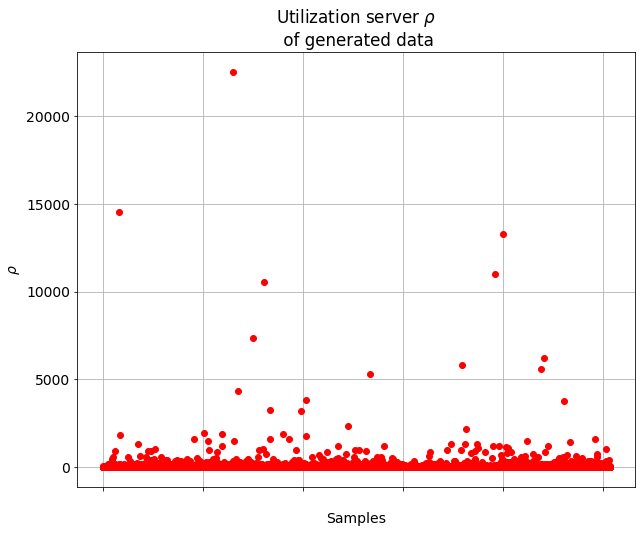

In [7]:
plt.figure(figsize=(10, 8))
plt.title('Utilization server ' r'$\rho$' '\n of generated data')
plt.plot(data['Rho'], 'or')
plt.xlabel(r'Samples');
plt.ylabel(r'$\rho$');
plt.xticks(color='w')
plt.grid()
plt.savefig('data/images/samples_rho.pdf')

Как видно из графиков мы имеем значения $\rho$ сильно превышающие диапазон $(0, 1)$. Нецелесообразно использовать такие данные для дальнейшего обучения моделей. Перед тем как начать отсекать строки, вспомни, что узлы нашей многофазной очереди имеют конечный буфер и пакеты при загруженном узле могут теряться. Значит загрузка на первом узле может быть $\rho >> 1$. Поэтому ограничемся  диапазоном $\rho \in (0, 10]$

In [8]:
simulation_data = data[data['Rho'] <= 10]

Приступим к тренировке моделей

In [9]:
train_data, test_data, y_train, y_test = train_test_split(
    simulation_data, simulation_data.loc[:, ['DelayAvg', 'DeliveryProb']], 
    test_size=0.33, 
    random_state=42)
x_train = train_data.loc[:, COLUMNS]
x_test = test_data.loc[:, COLUMNS]

### МЕТРИКИ
Для оценки полученных моделей нам будут необходимы метрики, а именно:

- Стандартное отклонение

In [10]:
def std(x: np.ndarray, y: np.ndarray) -> float:
    """
    Standard deviation between simulation model 
    values and estimates
    """
    return math.sqrt(np.sum((x-y)**2) / (len(x) - 1))

- Коэффициент корреляции

In [11]:
def corr(x: np.ndarray, y: np.ndarray) -> float:
    """
    Correlation coefficient between simulation model 
    values and estimate 
    """
    r = np.corrcoef(x, y)
    return r[0,1]

- среднеквадратичная ошибка;

```sklearn.metrics.mean_squared_error ```.

- и коэффициент детерминации.

```sklearn.metrics.r2_score```.

### Приступим непосредственно к обучению

-  ## Задача регресии МНК

In [12]:
"""Prepare regression model using Least Squares algorithm"""
def get_ls_regression_model(x_train, x_test, 
                            y_train, y_test) -> (np.ndarray, LinearRegression):
    ls = LinearRegression()
    # ls = Ridge(alpha=.5)
    ls.fit(x_train, y_train)
    ls_y = ls.predict(x_test)

    return ls_y, ls


In [13]:
ls_delay_estimate, ls = get_ls_regression_model(x_train, x_test, 
                                                y_train['DelayAvg'], 
                                                y_test['DelayAvg'])

In [14]:
print(f'R = {corr(y_test["DelayAvg"], ls_delay_estimate):.3f}')
print(f'STD = {std(y_test["DelayAvg"], ls_delay_estimate):.3f}')
print(f'MSE = {mean_squared_error(y_test["DelayAvg"], ls_delay_estimate):.3f}')
print(f'R2 = {r2_score(y_test["DelayAvg"], ls_delay_estimate):.3f}')

R = 0.926
STD = 66.309
MSE = 4396.716
R2 = 0.857


In [15]:
# DataFrame для отриосвки графиков
draw_data = test_data
draw_data.loc[:,'DelayAvgTest'] = y_test.loc[:,'DelayAvg']
draw_data.loc[:, 'LsDelayEst'] = ls_delay_estimate

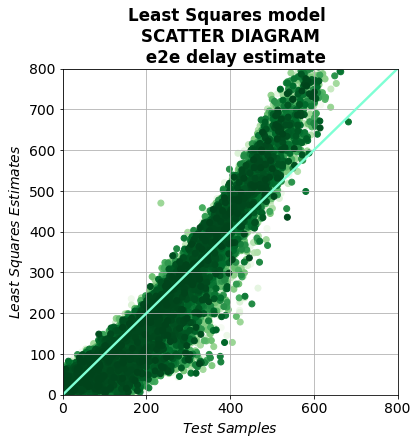

In [16]:
fig, ax = plt.subplots(figsize=(6, 6))
plt.grid()
cm = plt.get_cmap('Greens')
col = [cm(float(i)/(len(y_test))) for i in range((len(y_test)))]
ax.scatter(draw_data['LsDelayEst'], draw_data['DelayAvgTest'], c=col)
x = np.linspace(0,800,1000)
ax.plot(x, x, linestyle='-', linewidth=2.4, color='aquamarine')
ax.set_title('Least Squares model \n SCATTER DIAGRAM \n  e2e delay estimate', fontweight='bold')

plt.xlim([0, 800])
plt.ylim([0, 800])

plt.xlabel(r'$Test \ Samples$');
plt.ylabel(r'$Least \ Squares \ Estimates$');
plt.savefig('data/images/ls_scatter_diagram.pdf')

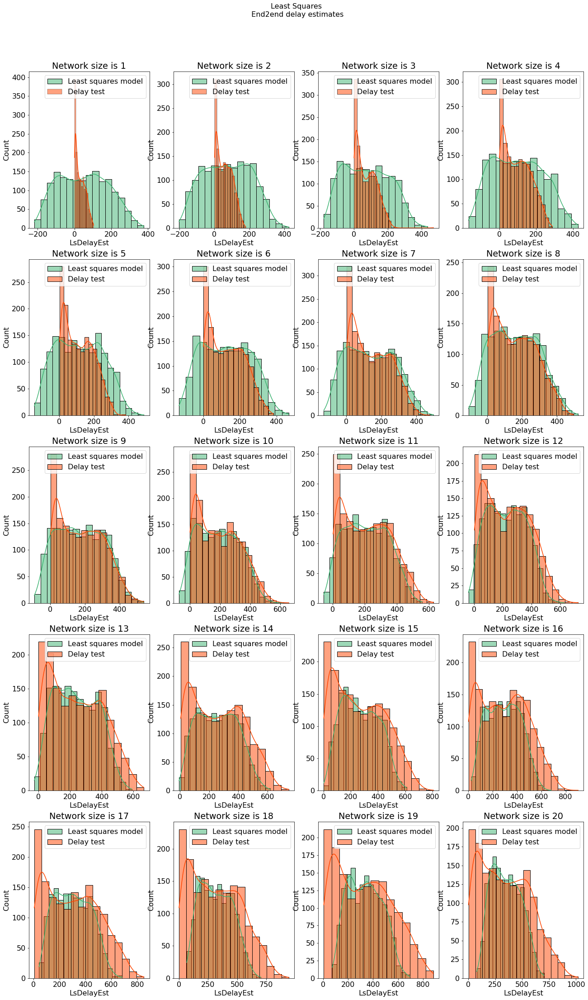

In [79]:
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(22, 35))
fig.suptitle('Least Squares \n End2end delay estimates \n', fontsize=16)
plt.subplots_adjust(top=0.92)

for i in net_size:
    draw_hist = draw_data.loc[draw_data['NetSize']==i]
    ax = fig.add_subplot(5, 4, int(i))
    ax.title.set_text('Network size is ' + str(int(i)))
    ax = sns.histplot(draw_hist.loc[:,'LsDelayEst'], 
                      color="mediumseagreen", 
                      label="Least squares model", kde=True)
    ax = sns.histplot(draw_hist.loc[:,'DelayAvgTest'], 
                      color="orangered", 
                      label="Delay test", kde=True)
    plt.legend()

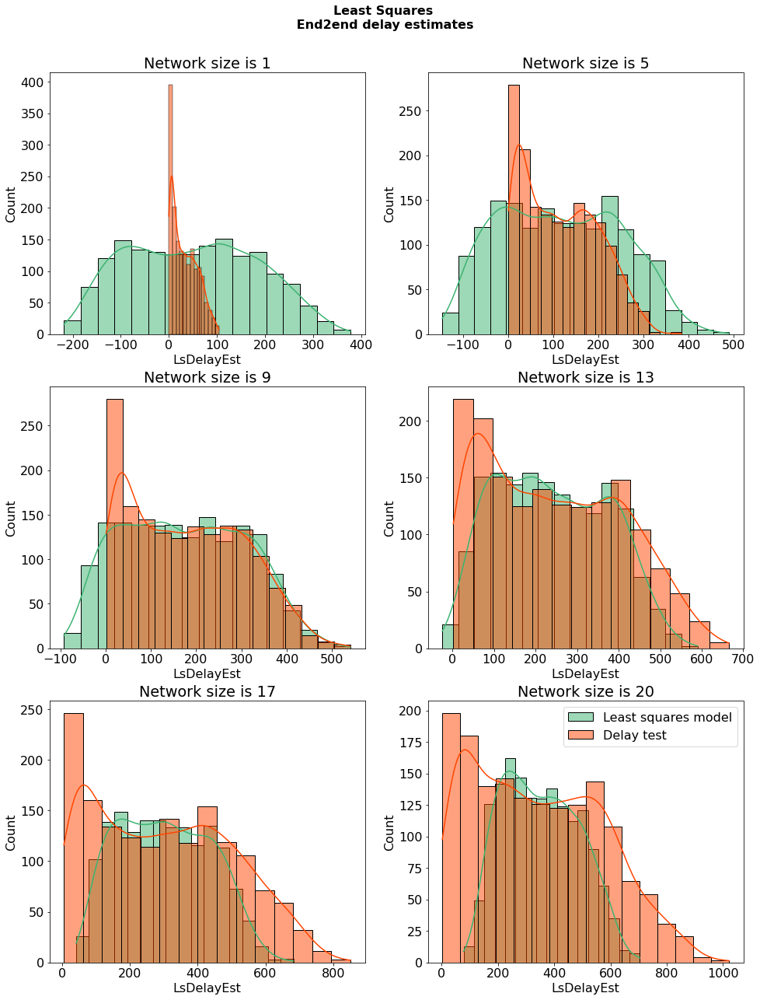

In [78]:
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(16, 20))
fig.suptitle('Least Squares \n End2end delay estimates \n', 
             fontsize=16,
             fontweight='bold')
plt.subplots_adjust(top=0.92)
k = 1
for i in net_size:
    size = [1, 5, 9, 13, 17, 20]
   
    if i in size:
        draw_hist = draw_data.loc[draw_data['NetSize']==i]
        ax = fig.add_subplot(3, 2, k)
        ax.title.set_text('Network size is ' + str(int(i)))
        ax = sns.histplot(draw_hist.loc[:,'LsDelayEst'], 
                          color="mediumseagreen", 
                          label="Least squares model", kde=True)
        ax = sns.histplot(draw_hist.loc[:,'DelayAvgTest'], 
                          color="orangered", 
                          label="Delay test", kde=True)
        
        k += 1
plt.legend()
plt.savefig('data/images/ls_histogram.pdf')

-  ## Задача регресии на дереве решений

In [29]:
"""Prepare regression model using Decision Tree algorithm"""
def get_tree_regression_model(x_train, x_test, 
                              y_train, y_test, 
                              max_depth=36, 
                              splitter='best') -> (np.ndarray, DecisionTreeRegressor):
    tree_reg = DecisionTreeRegressor(max_depth=max_depth, splitter=splitter)
    tree_reg.fit(x_train, y_train)
    tree_y = tree_reg.predict(x_test)
    
    # print(f'R = {corr(y_test, tree_y):.3f}')
    # print(f'STD = {std(y_test, tree_y):.3f}')
    # print(f'MSE = {mean_squared_error(y_test, tree_y):.3f}')

    return tree_y, tree_reg

In [30]:
tree_delay_estimate, tree_reg = get_tree_regression_model(x_train, x_test, 
                                                        y_train['DelayAvg'], 
                                                        y_test['DelayAvg'])

In [31]:
print(f'R = {corr(y_test["DelayAvg"], tree_delay_estimate,):.3f}')
print(f'STD = {std(y_test["DelayAvg"], tree_delay_estimate,):.3f}')
print(f'MSE = {mean_squared_error(y_test["DelayAvg"], tree_delay_estimate,):.3f}')
print(f'R2 = {r2_score(y_test["DelayAvg"], tree_delay_estimate,):.3f}')

R = 0.990
STD = 24.743
MSE = 612.186
R2 = 0.980


In [32]:
# plt.figure(figsize=(10,10))
# tree.plot_tree(tree_reg);

In [33]:
# DataFrame для отриосвки графиков
# draw_data = test_data
# draw_data.loc[:,'DelayAvgTest'] = y_test.loc[:,'DelayAvg']
draw_data.loc[:, 'TreeDelayEst'] = tree_delay_estimate 

На рисунке представлена **диаграмма рассеивания**

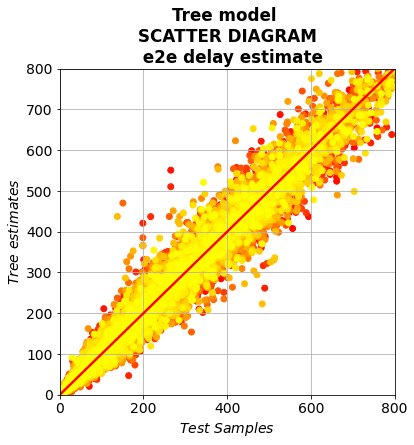

In [53]:
fig, ax = plt.subplots(figsize=(6, 6))
# plt.subplots_adjust(top=0.5)
plt.grid()
cm = plt.get_cmap('autumn')
col = [cm(float(i)/(len(y_test))) for i in range((len(y_test)))]
ax.scatter(draw_data['TreeDelayEst'], draw_data['DelayAvgTest'], c=col)
x = np.linspace(0,800,1000)
ax.plot(x, x, linestyle='-', linewidth=2.4, color='red')
ax.set_title('Tree model \n SCATTER DIAGRAM \n  e2e delay estimate', fontweight='bold')

plt.xlim([0, 800])
plt.ylim([0, 800])

plt.xlabel(r'$Test \ Samples$');
plt.ylabel(r'$Tree \ estimates$');
plt.savefig('data/images/tree_scatter_diagram.pdf', bbox_inches = 'tight')

 Для различных длин тандема сетей представлены гистограммы оценок времени межконцевых задержек тестовой выборки.

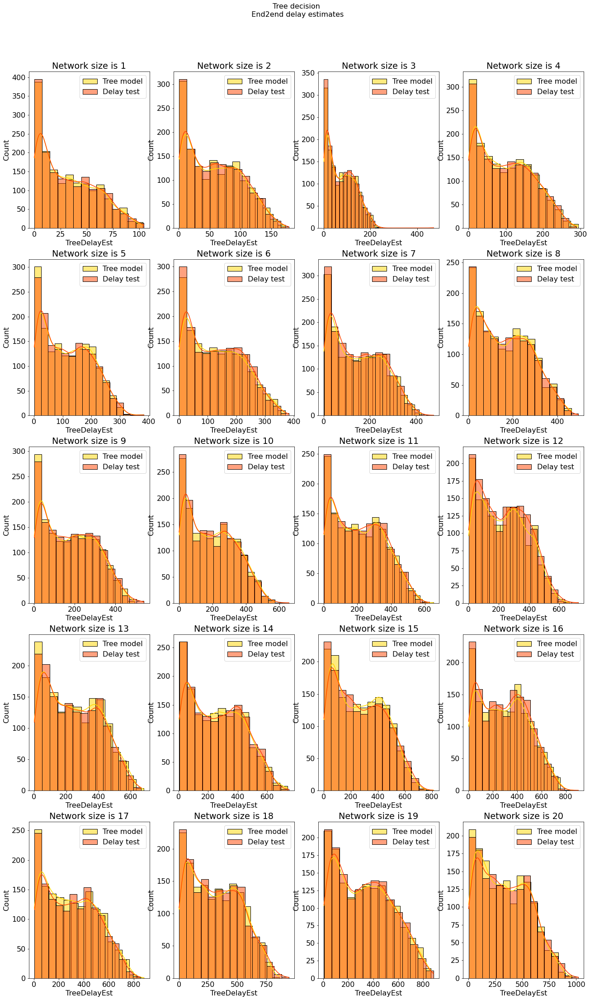

In [83]:
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(22, 35))
fig.suptitle('Tree decision \n End2end delay estimates \n', fontsize=16)
plt.subplots_adjust(top=0.92)

for i in net_size:
    draw_hist = draw_data.loc[draw_data['NetSize']==i]
    ax = fig.add_subplot(5, 4, int(i))
    ax.title.set_text('Network size is ' + str(int(i)))
    ax = sns.histplot(draw_hist.loc[:,'TreeDelayEst'], 
                      color="gold", 
                      label="Tree model", kde=True)
    ax = sns.histplot(draw_hist.loc[:,'DelayAvgTest'], 
                      color="orangered", 
                      label="Delay test", kde=True)
    plt.legend()

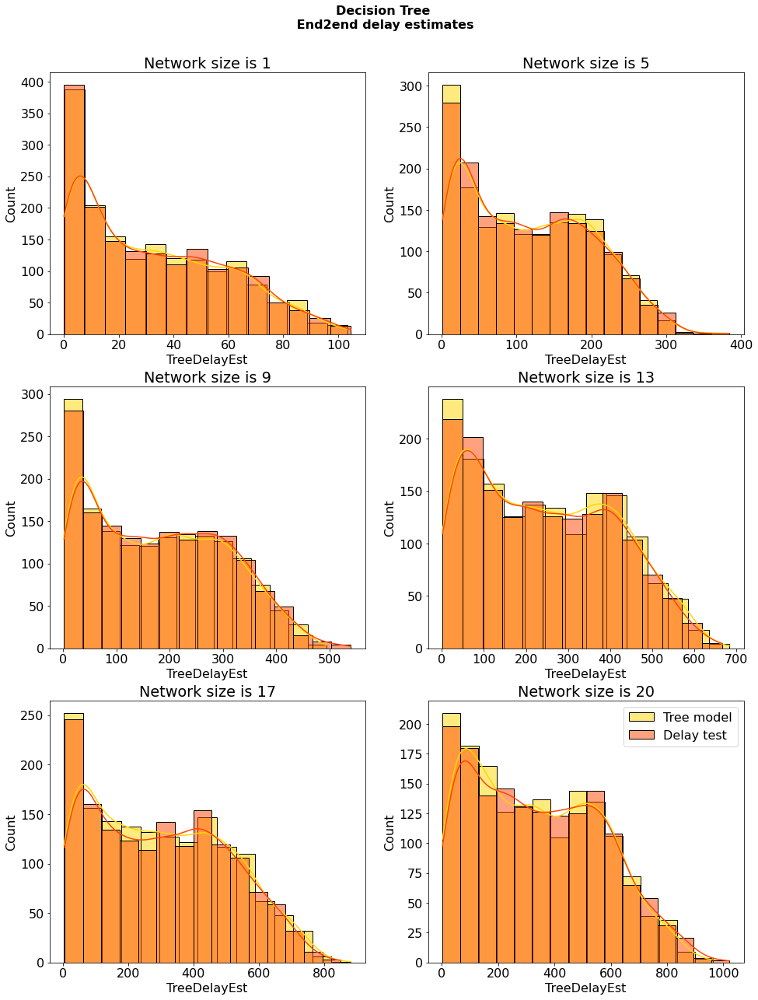

In [85]:
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(16, 20))
fig.suptitle('Decision Tree \n End2end delay estimates \n', 
             fontsize=16,
             fontweight='bold')
plt.subplots_adjust(top=0.92)
k = 1
for i in net_size:
    size = [1, 5, 9, 13, 17, 20]
   
    if i in size:
        draw_hist = draw_data.loc[draw_data['NetSize']==i]
        ax = fig.add_subplot(3, 2, k)
        ax.title.set_text('Network size is ' + str(int(i)))
        ax = sns.histplot(draw_hist.loc[:,'TreeDelayEst'], 
                          color="gold", 
                          label="Tree model", kde=True)
        ax = sns.histplot(draw_hist.loc[:,'DelayAvgTest'], 
                          color="orangered", 
                          label="Delay test", kde=True)
        
        k += 1
plt.legend()
plt.savefig('data/images/tree_histogram.pdf')

-  ## Задача регрессии с помощью градиентного бустинга на деревьях решений

In [86]:
"""Prepare regression model using Gradient Boosting algorithm"""
def get_gtb_regression_model(x_train, x_test, 
                             y_train, y_test, 
                             n_estimators=100, 
                             learning_rate=.1,
                             max_depth=10) -> (np.ndarray, GradientBoostingRegressor):
    gtb = GradientBoostingRegressor(n_estimators=n_estimators, 
                                    learning_rate=learning_rate, 
                                    max_depth=max_depth)
    gtb.fit(x_train, y_train)
    gtb_y = gtb.predict(x_test)

    return gtb_y, gtb

In [87]:
gtb_delay_estimate, gtb = get_tree_regression_model(x_train, x_test, 
                                               y_train['DelayAvg'], 
                                               y_test['DelayAvg'])

In [88]:
print(f'R = {corr(y_test["DelayAvg"], gtb_delay_estimate,):.3f}')
print(f'STD = {std(y_test["DelayAvg"], gtb_delay_estimate,):.3f}')
print(f'MSE = {mean_squared_error(y_test["DelayAvg"], gtb_delay_estimate,):.3f}')
print(f'R2 = {r2_score(y_test["DelayAvg"], gtb_delay_estimate,):.3f}')

R = 0.990
STD = 24.733
MSE = 611.707
R2 = 0.980


In [89]:
draw_data.loc[:, 'GTBDelayEst'] = gtb_delay_estimate 

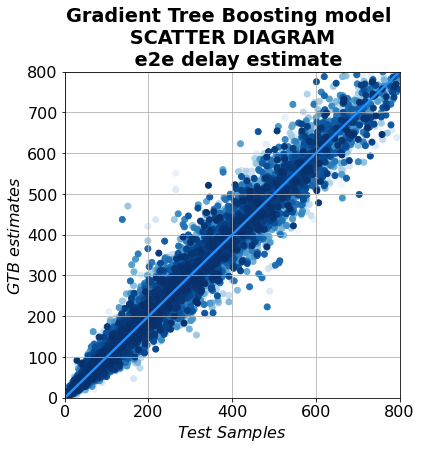

In [119]:
fig, ax = plt.subplots(figsize=(6, 6))
plt.grid()
cm = plt.get_cmap('Blues')
col = [cm(float(i)/(len(y_test))) for i in range((len(y_test)))]
ax.scatter(draw_data['TreeDelayEst'], draw_data['DelayAvgTest'], c=col)
x = np.linspace(0,800,1000)
ax.plot(x, x, linestyle='-', linewidth=2.4, color='dodgerblue')
ax.set_title('Gradient Tree Boosting model \n SCATTER DIAGRAM \n  e2e delay estimate', fontweight='bold')

plt.xlim([0, 800])
plt.ylim([0, 800])

plt.xlabel(r'$Test \ Samples$');
plt.ylabel(r'$GTB \ estimates$');
plt.savefig('data/images/gtb_scatter_diagram.pdf', bbox_inches = 'tight')

 Для различных длин тандема сетей представлены гистограммы оценок времени межконцевых задержек тестовой выборки.

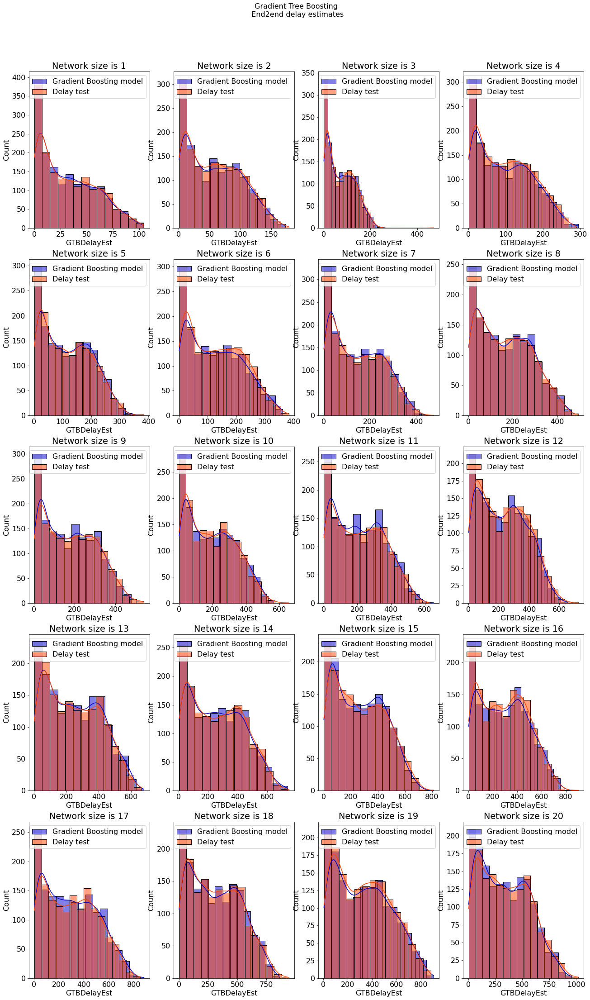

In [115]:
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(22, 35))
fig.suptitle('Gradient Tree Boosting \n End2end delay estimates \n', fontsize=16)
plt.subplots_adjust(top=0.92)

for i in net_size:
    draw_hist = draw_data.loc[draw_data['NetSize']==i]
    ax = fig.add_subplot(5, 4, int(i))
    ax.title.set_text('Network size is ' + str(int(i)))
    ax = sns.histplot(draw_hist.loc[:,'GTBDelayEst'], 
                      color="mediumblue", 
                      label="Gradient Boosting model", kde=True)
    ax = sns.histplot(draw_hist.loc[:,'DelayAvgTest'], 
                      color="orangered", 
                      label="Delay test", kde=True)
    plt.legend()

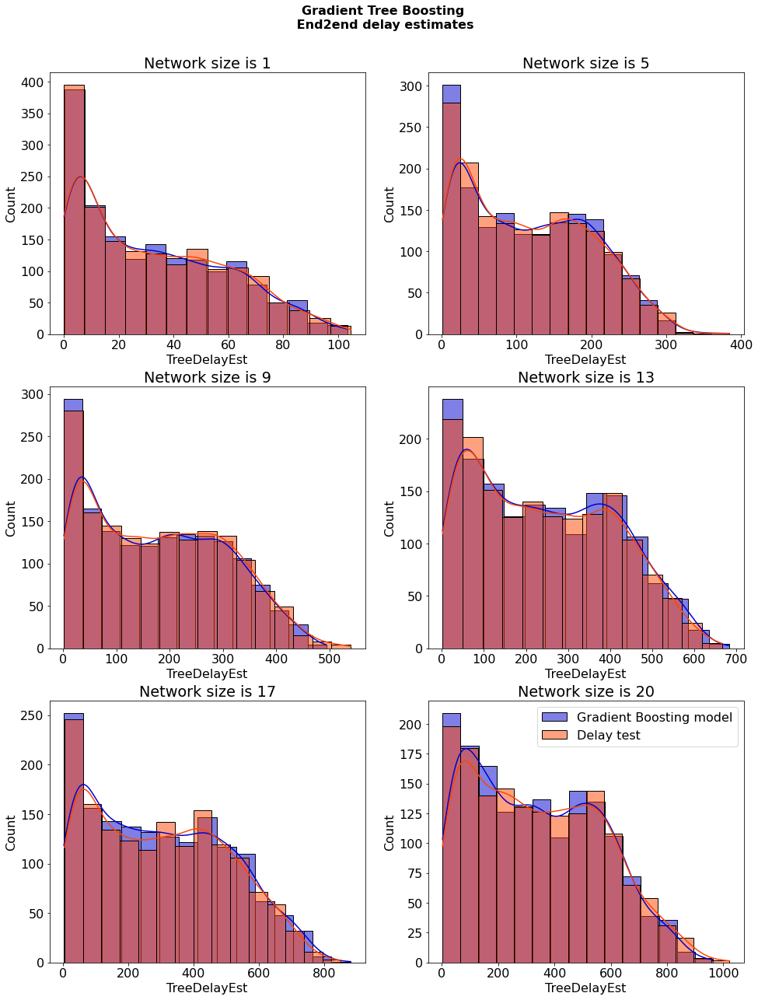

In [125]:
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(16, 20))
fig.suptitle('Gradient Tree Boosting \n End2end delay estimates \n', 
             fontsize=16,
             fontweight='bold')
plt.subplots_adjust(top=0.92)
k = 1
for i in net_size:
    size = [1, 5, 9, 13, 17, 20]
   
    if i in size:
        draw_hist = draw_data.loc[draw_data['NetSize']==i]
        ax = fig.add_subplot(3, 2, k)
        ax.title.set_text('Network size is ' + str(int(i)))
        ax = sns.histplot(draw_hist.loc[:,'TreeDelayEst'], 
                          color="mediumblue", 
                          label="Gradient Boosting model", kde=True)
        ax = sns.histplot(draw_hist.loc[:,'DelayAvgTest'], 
                          color="orangered", 
                          label="Delay test", kde=True)
        
        
        k += 1
plt.legend()
plt.savefig('data/images/gtb_histogram.pdf')

-  ## Задача регрессии с помощью искуственной нейронной сети на алгоритме Adam

In [109]:
def normalize(table, stat) -> pd.core.frame.DataFrame:
    """Prepare data for ANN"""
    return (table - stat.loc['mean',:].transpose()) / stat.loc['std',:].transpose()

Необходимо провести нормализацию входных данных перед тем, как непосредственно приступить к обучению нейронной сети 

In [110]:
train_normalize = normalize(x_train, simulation_data.loc[:,COLUMNS].describe())
train_normalize.to_numpy();
test_normalize = normalize(x_test, simulation_data.loc[:,COLUMNS].describe())
test_normalize.to_numpy();

Построем модель будущей сети. Наша сеть состоит из одного скрытого слоя. Для обучения будем использовать алгоритм Адама.

In [111]:
def build_model(size, activation='sigmoid') -> np.ndarray:
    model = keras.Sequential([
        # Input Layer
        layers.Dense(18, activation=activation, 
                     use_bias=True, input_shape=[size]),
        # Hidden Layer
        layers.Dense(18, activation=activation, use_bias=True),
        # Output layer
        layers.Dense(1)])

    optimizer = tf.keras.optimizers.Adam(0.01)

    model.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=['mse'])
    return model


def get_ann_regression_model(train_normalize, 
                             test_normalize, 
                             y_train_ann, y_test_ann, 
                             size,
                             epochs=1000,
                             activation='sigmoid') -> Tuple[np.ndarray, 
                                                            engine.sequential.Sequential]:
    
    ann = build_model(size=size)
   
    early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
    EPOCHS = epochs
    keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
    
    ann.fit(train_normalize, y_train_ann, epochs=EPOCHS, validation_split=0.3, verbose=0, 
            callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)])

    ann_y = ann.predict(test_normalize).flatten();
    
    # print(f"R = {corr(y_test_ann, ann_y):.3f}")
    # print(f"STD = {std(y_test_ann, ann_y):.3f}")
    # print(f"MSE = {mean_squared_error(y_test_ann, ann_y):.3f}")
    
    return ann_y, ann


In [121]:
%%time
ann_delay_estimate, ann = get_ann_regression_model(train_normalize, test_normalize,
                                                   y_train['DelayAvg'], y_test['DelayAvg'],
                                                   size=len(simulation_data.loc[:,COLUMNS].keys()))

CPU times: user 1min 11s, sys: 8.82 s, total: 1min 20s
Wall time: 41.8 s


In [159]:
print(f'R = {corr(y_test["DelayAvg"], ann_delay_estimate,):.3f}')
print(f'STD = {std(y_test["DelayAvg"], ann_delay_estimate,):.3f}')
print(f'MSE = {mean_squared_error(y_test["DelayAvg"], ann_delay_estimate,):.3f}')
print(f'R2 = {r2_score(y_test["DelayAvg"], ann_y,):.3f}')

R = 0.998
STD = 10.504
MSE = 110.323
R2 = 0.997


In [29]:
# def build_model(size) -> np.ndarray:
#     model = keras.Sequential([
#         # Input Layer
#         layers.Dense(18, activation='sigmoid', 
#                      use_bias=True, input_shape=[size]),
#         # Hidden Layer
#         layers.Dense(18, activation='sigmoid', use_bias=True),
#         # Output layer
#         layers.Dense(1)])

#     optimizer = tf.keras.optimizers.Adam(0.01)

#     model.compile(loss='mse',
#                   optimizer=optimizer,
#                   metrics=['mse'])
#     return model


    
# ann = build_model(len(simulation_data.loc[:,COLUMNS].keys()))

In [30]:
# %%time
# early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
# EPOCHS = 1000
# keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
# history = ann.fit(train_normalize, y_train['DelayAvg'], 
#                     epochs=EPOCHS, 
#                     validation_split = 0.3, verbose=0, 
#                     callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', 
#                                                              patience=10)])

# ann_y = ann.predict(test_normalize).flatten()

In [31]:
# print(f"R = {corr(y_test['DelayAvg'], ann_y):.3f}")
# print(f"STD = {std(y_test['DelayAvg'], ann_y):.3f}")
# print(f"MSE = {mean_squared_error(y_test['DelayAvg'], ann_y):.3f}")

На рисунке представлена диаграмма рассеивания полученной модели с помощью нейронной сети

In [113]:
# Добавим в draw_data оценку ann_y 
draw_data['AnnDelayEst'] = ann_y

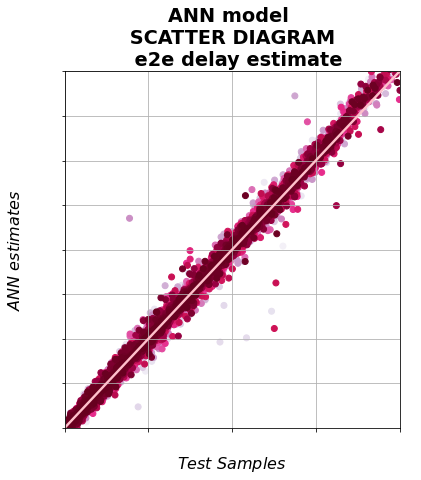

In [137]:
plt.subplots(figsize=(6, 6))
cm = plt.get_cmap('PuRd')
col = [cm(float(i)/(len(ann_y))) for i in range((len(ann_y)))]
ax = plt.scatter(draw_data['AnnDelayEst'], 
                 draw_data['DelayAvgTest'], 
                 c=col)
plt.subplots_adjust(top=0.95)
x = np.linspace(0,800,1000)
plt.plot(x, x, 
         linestyle='-', 
         linewidth=2.4, 
         color='pink')
plt.title('ANN model \n SCATTER DIAGRAM \n  e2e delay estimate', fontweight='bold')

plt.xticks(color='w')
plt.yticks(color='w')

plt.xlim([0, 800])
plt.ylim([0, 800])

plt.xlabel(r'$Test \ Samples$')
plt.ylabel(r'$ANN \ estimates$')

plt.grid()


In [124]:
# net_size = draw_data['NetSize'].unique()
# net_size.sort()
# fig = plt.figure(figsize=(22, 18))
# fig.suptitle('ANN \n End2end delay estimates \n', fontsize=16)
# plt.subplots_adjust(top=0.92)
# for i in net_size:
#     draw_hist = draw_data.loc[draw_data['NetSize']==i]
#     ax = fig.add_subplot(5, 4, int(i))
#     ax.title.set_text('Network size is ' + str(int(i)))    
#     sns.histplot(draw_hist.loc[:,['AnnDelayEst','DelayAvgTest']], 
#                  kde=True)
#     plt.legend(['ANN estimates', 'Test samples'])


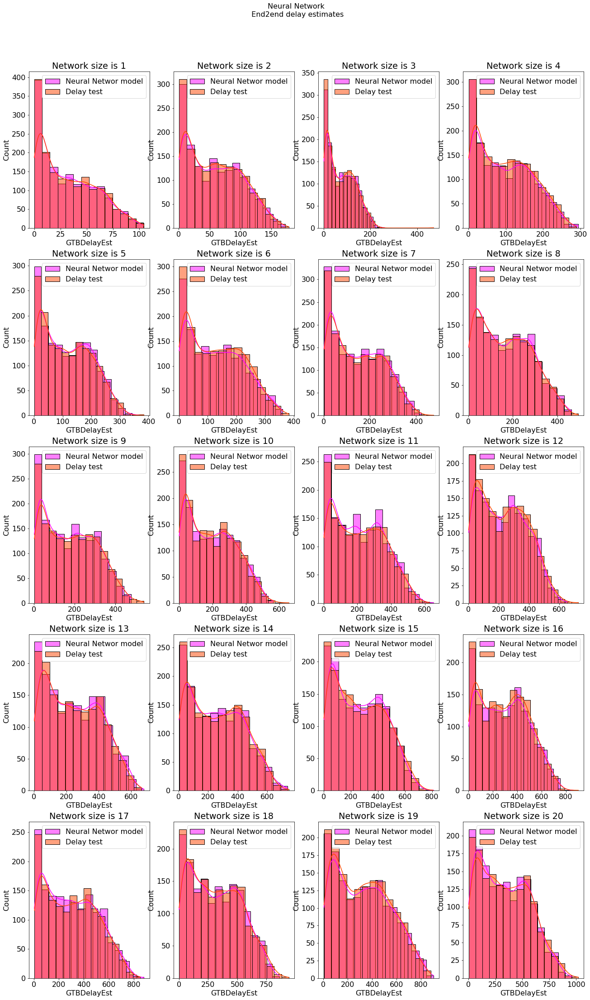

In [134]:
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(22, 35))
fig.suptitle('Neural Network \n End2end delay estimates \n', fontsize=16)
plt.subplots_adjust(top=0.92)

for i in net_size:
    draw_hist = draw_data.loc[draw_data['NetSize']==i]
    ax = fig.add_subplot(5, 4, int(i))
    ax.title.set_text('Network size is ' + str(int(i)))
    ax = sns.histplot(draw_hist.loc[:,'GTBDelayEst'], 
                      color="fuchsia", 
                      label="Neural Networ model", kde=True)
    ax = sns.histplot(draw_hist.loc[:,'DelayAvgTest'], 
                      color="orangered", 
                      label="Delay test", kde=True)
    plt.legend()

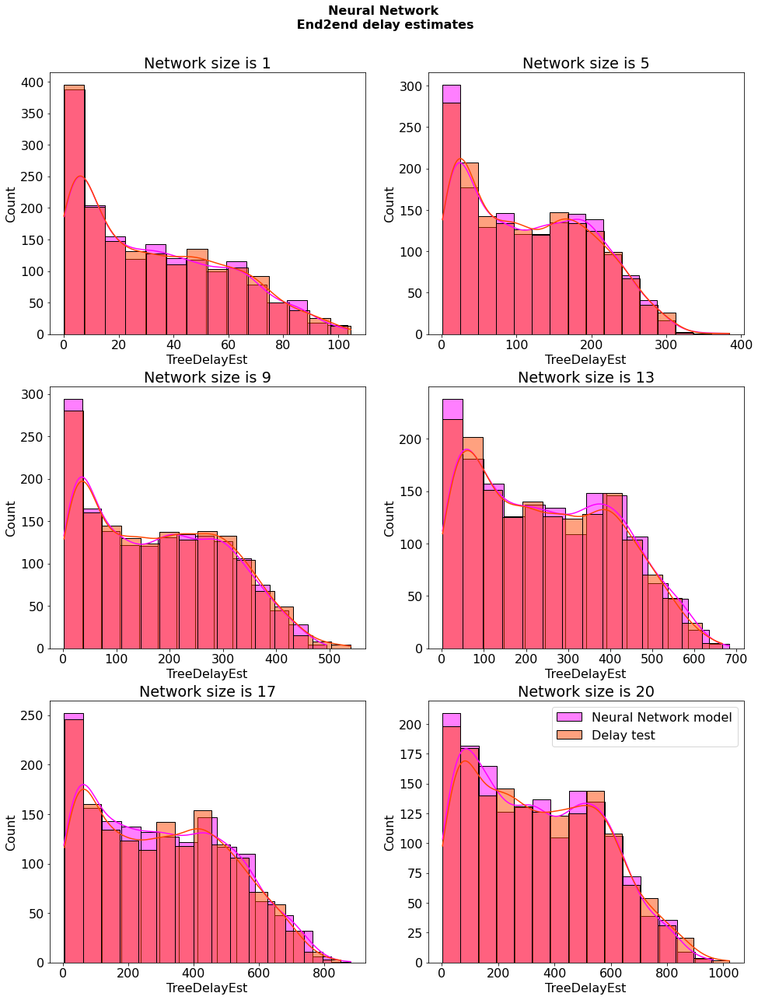

In [162]:
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(16, 20))
fig.suptitle('Neural Network \n End2end delay estimates \n', 
             fontsize=16,
             fontweight='bold')
plt.subplots_adjust(top=0.92)
k = 1
for i in net_size:
    size = [1, 5, 9, 13, 17, 20]
   
    if i in size:
        draw_hist = draw_data.loc[draw_data['NetSize']==i]
        ax = fig.add_subplot(3, 2, k)
        ax.title.set_text('Network size is ' + str(int(i)))
        ax = sns.histplot(draw_hist.loc[:,'TreeDelayEst'], 
                          color="fuchsia", 
                          label="Neural Network model", kde=True)
        ax = sns.histplot(draw_hist.loc[:,'DelayAvgTest'], 
                          color="orangered", 
                          label="Delay test", kde=True)
        
        
        k += 1
plt.legend()
plt.savefig('data/images/ann_histogram.pdf')

Общий график диаграммы рассеивания для всех регрессионных моделей

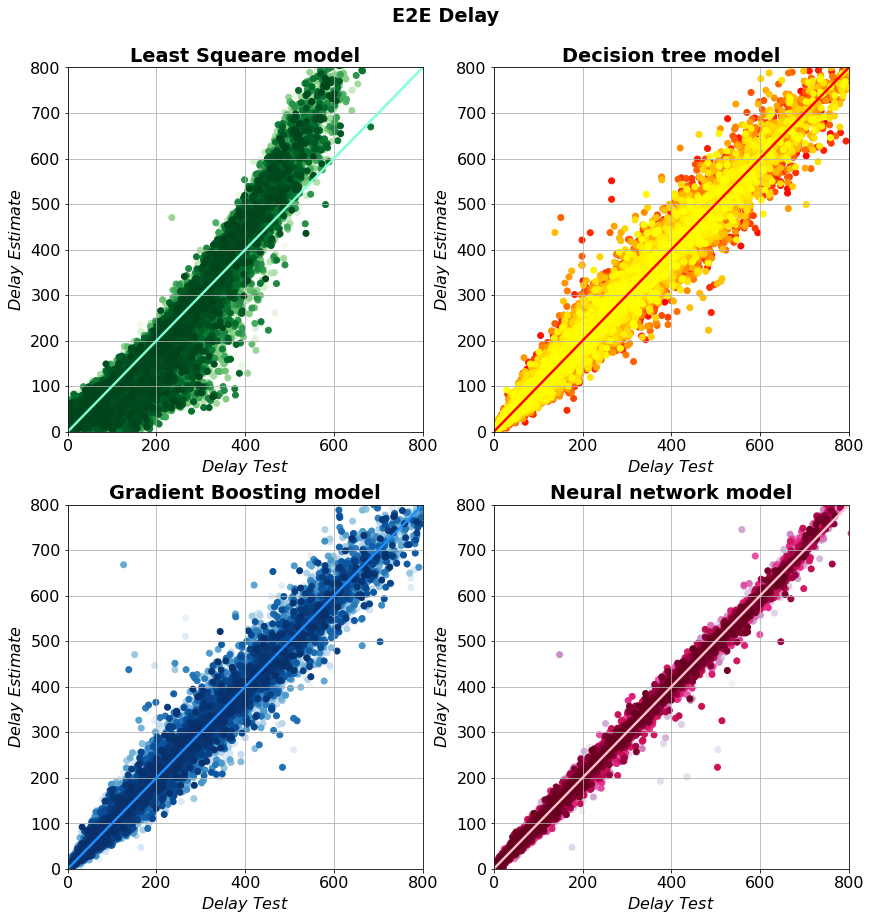

In [158]:
model = [ls_delay_estimate, 
         tree_delay_estimate,
         gtb_delay_estimate,
         ann_delay_estimate]

label = ['Least Squeare model',
         'Decision tree model',
         'Gradient Boosting model',
         'Neural network model']
column = ['LsDelayEst',
          'TreeDelayEst',
          'GTBDelayEst',
          'AnnDelayEst']
scatter_color = ['Greens',
                 'autumn',
                 'Blues',
                 'PuRd']
diag_line_color = ['aquamarine', 
                   'red',
                   'dodgerblue',
                   'pink']

fig = plt.figure(figsize=(14, 14))
plt.subplots_adjust(top=0.92)
plt.suptitle('E2E Delay', fontweight='bold')

for i in range(4):
    ax = fig.add_subplot(2, 2, i+1)
    ax.set_title(label[i], fontdict={'fontweight': 'bold'})
    cm = plt.get_cmap(scatter_color[i])
    col = [cm(float(i)/(len(ann_delay_estimate))) for i in range((len(ann_delay_estimate)))]
    ax = plt.scatter(draw_data[column[i]], 
                 draw_data['DelayAvgTest'], 
                 c=col)
#     plt.subplots_adjust(top=0.95)
    plt.plot(x, x, 
             linestyle='-', 
             linewidth=2.4, 
             color=diag_line_color[i])
    plt.xlim([0, 800])
    plt.ylim([0, 800])
    plt.xlabel(r'$Delay \ Test$')
    plt.ylabel(r'$Delay \ Estimate$')
    plt.grid()
plt.savefig('data/images/total_scatter_diagram.pdf')

In [ ]:
# net_size = draw_data['NetSize'].unique()
# net_size.sort()
# fig = plt.figure(figsize=(16, 20))
# fig.suptitle('Neural Network \n End2end delay estimates \n', 
#              fontsize=16,
#              fontweight='bold')
# plt.subplots_adjust(top=0.92)
# k = 1
# for i in net_size:
#     size = [1, 5, 9, 13, 17, 20]
   
#     if i in size:
#         draw_hist = draw_data.loc[draw_data['NetSize']==i]
#         ax = fig.add_subplot(3, 2, k)
#         ax.title.set_text('Network size is ' + str(int(i)))
#         ax = sns.histplot(draw_hist.loc[:,'TreeDelayEst'], 
#                           color="fuchsia", 
#                           label="Neural Network model", kde=True)
#         ax = sns.histplot(draw_hist.loc[:,'DelayAvgTest'], 
#                           color="orangered", 
#                           label="Delay test", kde=True)
        
        
#         k += 1
# plt.legend()


In [35]:
## Задачи регрессии на градиентном бустинге с алгоритмом CatBoost

In [36]:
# from catboost import CatBoostClassifier, CatBoostRegressor
# catboost_regression_model = CatBoostRegressor();
# catboost_regression_model.fit(x_train, y_train['DelayAvg']);
# a = catboost_regression_model.predict(x_test, y_test['DelayAvg'])

In [37]:
# # from catboost import CatBoostClassifier, CatBoostRegressor
# def get_catboost_regression_model(x_train, x_test, 
#                                   y_train, y_test)-> Tuple[np.array, list, list]: 
#     catboost_model = CatBoostRegressor(
#         iterations=1000,
#         learning_rate=0.1)
#     binary_train = [1 if i > BOUNDARY else 0 for i in y_train['DeliveryProb']]
#     binary_test = [1 if i > BOUNDARY else 0 for i in y_test['DeliveryProb']]
#     model.fit(
#         x_train, binary_train,
#         verbose=False
#     )
#     catboost_prob_estimate = model.predict(x_test)
    
#     return catboost_prob_estimate, binary_train, binary_test

In [38]:
# catboost_prob_estimate, prob_clf_train, prob_clf_test = get_tree_classif_model(x_train, 
#                                                                                x_test, 
#                                                                                y_train['DeliveryProb'], 
#                                                                                y_test['DeliveryProb'])

# catboost_prob_precision_score = '{:.3f}'.format(precision_score(prob_clf_test, catboost_prob_estimate))
# catboost_prob_recall_score = '{:.3f}'.format(recall_score(prob_clf_test, catboost_prob_estimate))
# catboost_prob_f1_score = '{:.3f}'.format(f1_score(prob_clf_test, catboost_prob_estimate))
# print(catboost_prob_precision_score)
# print(catboost_prob_recall_score)
# print(catboost_prob_f1_score)

# print(f"R = {corr(y_test['DelayAvg'], ann_y):.3f}")
# print(f"STD = {std(y_test['DelayAvg'], ann_y):.3f}")
# print(f"MSE = {mean_squared_error(y_test['DelayAvg'], ann_y):.3f}")

## ПОСТРОЕНИЕ ПРОГНОЗНОЙ МОДЕЛИ ВЕРОЯТНОСТИ ДОСТАВКИ ПАКЕТОВ В МНОГОФАЗНОЙ СЕТИ МАСОВОГО ОБСЛУЖИВАНИЯ С ЛИНЕЙНОЙ ТОПОЛОГИЕЙ

В отличии от прогнозной модели времени межконцевой задержки, для которой мы строили регрессионную модель, для модели вероятности доставки нам не критично предсказывать конкретные значения. Гораздо важнее оценивать вероятность относительно граничного значения. Мы задаемся граничным условием `BOUNDARY` для условия успешной доставки. 

Будем классификать на две группы:
- успешная доставка P $\in$ \[BOUNDARY, 1];
- вероятность потери пакетов P $\in$  [0, BOUNDARY).
        


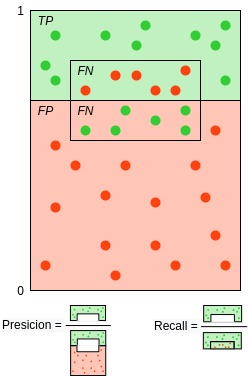

In [163]:
from IPython import display 
display.Image("../experiments/data/images/clf_metrics.jpg")

### Метрики для задач классификации:

_TP_ is true posistive;

_TN_ is true negative;

_FP_ is false positive;

_FN_ is false negative.

Для оценки моделей будем использовать следущие метрики:    
   
$$
    1. \ Precision = \dfrac{TP}{TP + FP};
$$

$$
    2. \ Recall = \dfrac{TP}{TP + FN};
$$

$$
    3. \ F_1 = 2 * \dfrac{Precision * Recall}{Precision + Recall}. 
$$

In [40]:
# from sklearn.linear_model import LogisticRegression
# logreg = LogisticRegression()
# binary_train = [1 if i >= 0.9 else 0 for i in y_train['DeliveryProb']]
# logreg.fit(x_train, binary_train)

- ## Модель задачи классификации на Дереве решений

In [164]:
"""Prepare classification model using Decision Tree algorithm"""
def get_tree_classif_model(x_train, x_test, 
                           y_train, y_test, 
                           boundary=0.9, 
                           max_depth=10, 
                           splitter='best') -> Tuple[np.array, 
                                                     DecisionTreeClassifier, 
                                                     list, 
                                                     list]:
    binary_train = [1 if i >= boundary else 0 for i in y_train]
    binary_test = [1 if i >= boundary else 0 for i in y_test]
    clf = DecisionTreeClassifier(max_depth=max_depth, splitter=splitter)
    clf = clf.fit(x_train, binary_train)
    prob_estimate = clf.predict(x_test)
    return prob_estimate, clf, binary_train, binary_test

In [234]:
BOUNDARY = 0.9 
prob_clf_train = [1 if i > BOUNDARY else 0 for i in y_train['DeliveryProb']]
prob_clf_test = [1 if i > BOUNDARY else 0 for i in y_test['DeliveryProb']]

tree_prob_estimate, tree_clf, prob_clf_train, prob_clf_test = get_tree_classif_model(x_train, 
                                                                                     x_test, 
                                                                                     y_train['DeliveryProb'], 
                                                                                     y_test['DeliveryProb'],
                                                                                     boundary=BOUNDARY)

tree_prob_precision_score = '{:.3f}'.format(precision_score(prob_clf_test, tree_prob_estimate))
tree_prob_recall_score = '{:.3f}'.format(recall_score(prob_clf_test, tree_prob_estimate))
tree_prob_f1_score = '{:.3f}'.format(f1_score(prob_clf_test, tree_prob_estimate))
print(tree_prob_precision_score)
print(tree_prob_recall_score)
print(tree_prob_f1_score)

0.918
0.905
0.912


In [166]:
draw_data['TreeDeliveryProbTest'] = y_test['DeliveryProb']
draw_data['TreeDeliveryProbEst'] = tree_prob_estimate

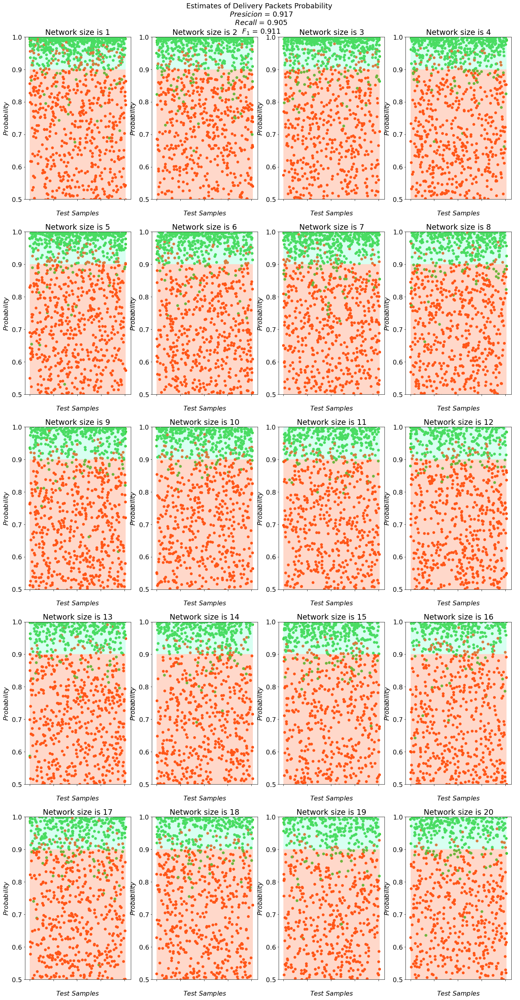

In [167]:
YLIM = [0.5, 1]
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(22, 40))
fig.suptitle(r'Estimates of Delivery Packets Probability' + 
             ' \n $Presicion$ = {}\n $Recall$ = {}\n $F_1$ = {}'.format(
                tree_prob_precision_score, 
                tree_prob_recall_score, 
                tree_prob_f1_score), fontsize=18)
plt.subplots_adjust(top=0.95)
for i in net_size:
    draw_plot = draw_data.loc[draw_data['NetSize']==i]
    ax = fig.add_subplot(5, 4,  int(i))
    
    ax.title.set_text('Network size is ' + str(int(i)))    
    plt.ylim(YLIM)

    prob_color = ['limegreen' if i >BOUNDARY else 'orangered' for i in draw_plot['TreeDeliveryProbEst']]
    ax.scatter(draw_plot['TreeDeliveryProbTest'].index, draw_plot['TreeDeliveryProbTest'], 
               color=prob_color)
    ax.add_patch(
     patches.Rectangle(
        (0, 0),
        width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
        height=BOUNDARY,
        facecolor = 'coral',
        fill=True,
        alpha=0.3))
    ax.add_patch(
     patches.Rectangle(
        (0, BOUNDARY),
        width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
        height=1 - BOUNDARY,
        facecolor = 'aquamarine',
        fill=True, alpha=0.3))

    plt.xticks(color='w')   
    ax.set_xlabel(r'$Test \ Samples$')
    ax.set_ylabel(r'$Probability$')

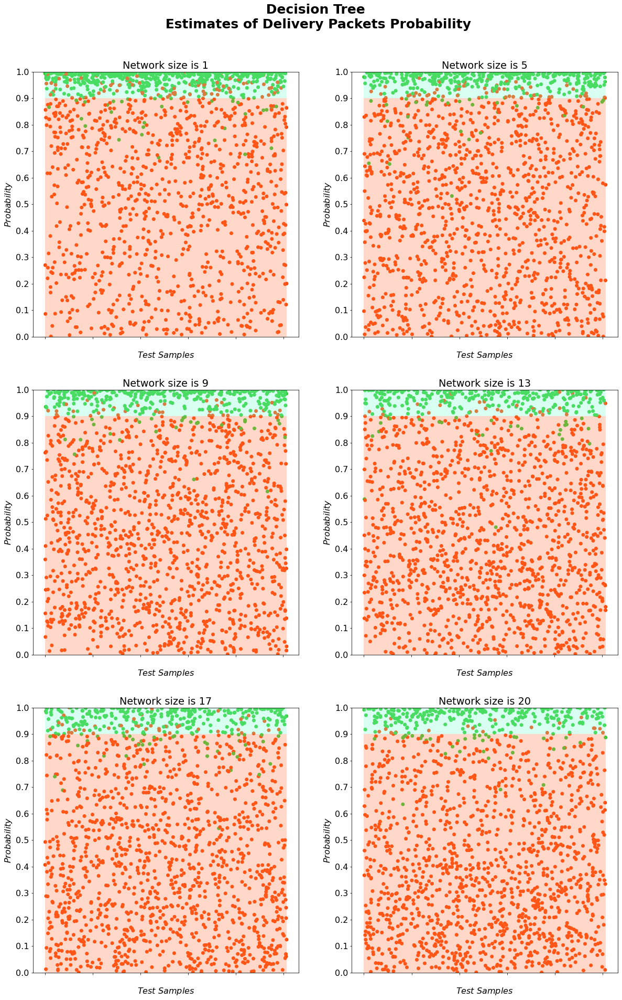

In [188]:
YLIM = [0, 1]
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(20, 30))
# fig.suptitle(r'Estimates of Delivery Packets Probability' + 
#              ' \n $Presicion$ = {}\n $Recall$ = {}\n $F_1$ = {}'.format(
#                 tree_prob_precision_score, 
#                 tree_prob_recall_score, 
#                 tree_prob_f1_score), fontsize=18)
fig.suptitle(r' Decision Tree' + 
             ' \n Estimates of Delivery Packets Probability', 
             fontsize=25,
             fontweight='bold')
plt.subplots_adjust(top=0.92)
k = 1
for i in net_size:
    size = [1, 5, 9, 13, 17, 20]
    if i in size:
        draw_plot = draw_data.loc[draw_data['NetSize']==i]
        ax = fig.add_subplot(3, 2,  int(k))

        ax.title.set_text('Network size is ' + str(int(i)))    
        plt.ylim(YLIM)

        prob_color = ['limegreen' if i >BOUNDARY else 'orangered' for i in draw_plot['TreeDeliveryProbEst']]
        ax.scatter(draw_plot['TreeDeliveryProbTest'].index, draw_plot['TreeDeliveryProbTest'], 
                   color=prob_color)
        ax.add_patch(
         patches.Rectangle(
            (0, 0),
            width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
            height=BOUNDARY,
            facecolor = 'coral',
            fill=True,
            alpha=0.3))
        ax.add_patch(
         patches.Rectangle(
            (0, BOUNDARY),
            width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
            height=1 - BOUNDARY,
            facecolor = 'aquamarine',
            fill=True, alpha=0.3))

        plt.xticks(color='w')   
        ax.set_xlabel(r'$Test \ Samples$')
        ax.set_ylabel(r'$Probability$')
        k += 1
        plt.xticks(color='w')
        plt.yticks(np.arange(0, 1.1, 0.1))   
plt.savefig('data/images/tree_clf_prob.pdf')

- ## Модель задачи классификации на многослойном персептроне с алгоритмом Adam

In [199]:
"""Prepare classification model using MLP algorithm"""
def get_mlp_classif_model(x_train, x_test, 
                          y_train, y_test,
                          boundary=0.9, 
                          solver='adam',
                          activation='relu',
                          hidden_layer_sizes=(12, 12, 12)) -> Tuple[np.array, 
                                                                  MLPClassifier,
                                                                  list, list]:
    
    binary_train = [1 if i > boundary else 0 for i in y_train]
    binary_test = [1 if i > boundary else 0 for i in y_test]

    clf = MLPClassifier(solver=solver, activation=activation, 
                        hidden_layer_sizes=hidden_layer_sizes, 
                        max_iter=2000, learning_rate='adaptive'
                        ).fit(x_train, binary_train)
    prob_estimate = clf.predict(x_test)

    return prob_estimate, clf, binary_train, binary_test

In [226]:
BOUNDARY = 0.9

mlpc_prob_estimate, mlpc_clf, prob_clf_train, prob_clf_test = get_mlp_classif_model(train_normalize, test_normalize,
                                                                                    y_train['DeliveryProb'], 
                                                                                    y_test['DeliveryProb'],
                                                                                    boundary=0.9, 
                                                                                    hidden_layer_sizes=(54, 54))
mlpc_prob_precision_score = '{:.3f}'.format(precision_score(prob_clf_test, mlpc_prob_estimate))
mlpc_prob_recall_score = '{:.3f}'.format(recall_score(prob_clf_test, mlpc_prob_estimate))
mlpc_prob_f1_score = '{:.3f}'.format(f1_score(prob_clf_test, mlpc_prob_estimate))
print(mlpc_prob_precision_score)
print(mlpc_prob_recall_score)
print(mlpc_prob_f1_score)

0.977
0.951
0.964


In [227]:
draw_data['MLPCDeliveryProbEst'] = mlpc_prob_estimate

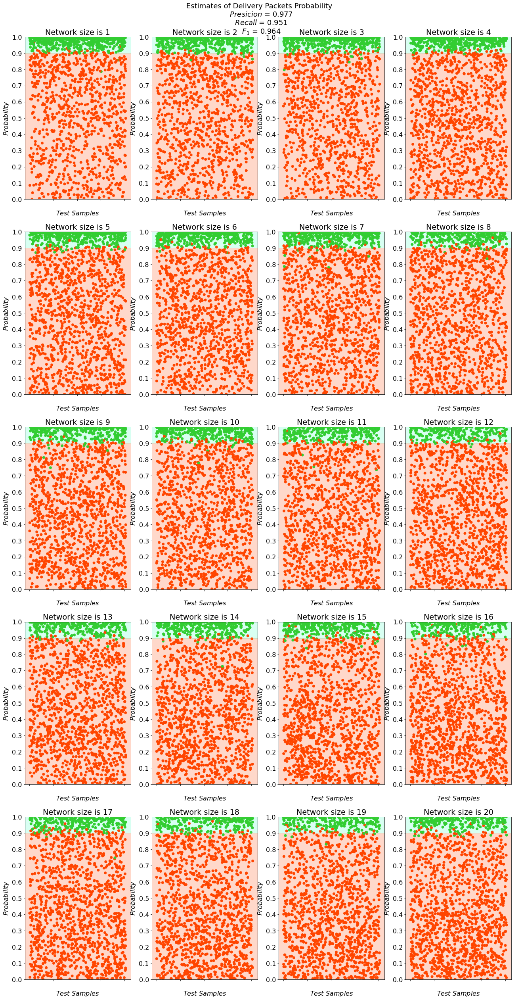

In [228]:
YLIM = [0.5, 1]
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(22, 40))
fig.suptitle(
    'Estimates of Delivery Packets Probability \n $Presicion$ = {}\n $Recall$ = {}\n $F_1$ = {}'.format(
        mlpc_prob_precision_score, 
        mlpc_prob_recall_score, 
        mlpc_prob_f1_score), 
    fontsize=18)
plt.subplots_adjust(top=0.95)
for i in net_size:
    draw_plot = draw_data.loc[draw_data['NetSize']==i]
    ax = fig.add_subplot(5, 4,  int(i))
    ax.axhspan(0, .9, color='coral', zorder=0, alpha=0.3)
    ax.axhspan(.9, 1, color='aquamarine', zorder=0, alpha=0.3)
    ax.title.set_text('Network size is ' + str(int(i)))    
    plt.ylim(YLIM)

    prob_color = ['limegreen' if i >BOUNDARY else 'orangered' for i in draw_plot['MLPCDeliveryProbEst']]
    ax.scatter(draw_plot['TreeDeliveryProbTest'].index, draw_plot['TreeDeliveryProbTest'], 
               color=prob_color)
    plt.xticks(color='w')
    plt.yticks(np.arange(0, 1.1, 0.1))   
    ax.set_xlabel(r'$Test \ Samples$')
    ax.set_ylabel(r'$Probability$')

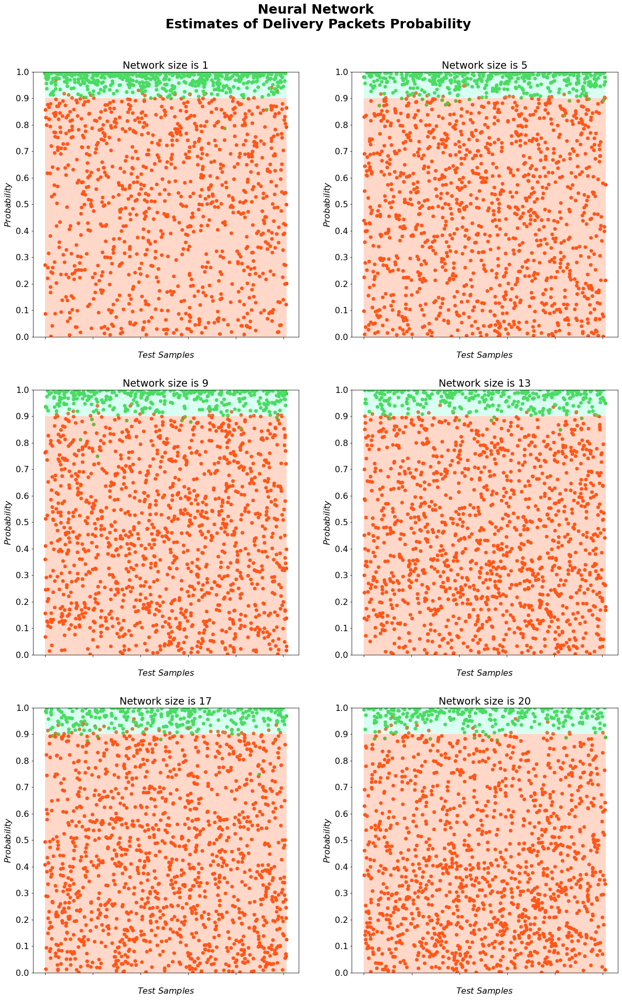

In [229]:
YLIM = [0, 1]
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(20, 30))
# fig.suptitle(r'Estimates of Delivery Packets Probability' + 
#              ' \n $Presicion$ = {}\n $Recall$ = {}\n $F_1$ = {}'.format(
#                 tree_prob_precision_score, 
#                 tree_prob_recall_score, 
#                 tree_prob_f1_score), fontsize=18)
fig.suptitle(r' Neural Network' + 
             ' \n Estimates of Delivery Packets Probability', 
             fontsize=25,
             fontweight='bold')
plt.subplots_adjust(top=0.92)
k = 1
for i in net_size:
    size = [1, 5, 9, 13, 17, 20]
    if i in size:
        draw_plot = draw_data.loc[draw_data['NetSize']==i]
        ax = fig.add_subplot(3, 2,  int(k))

        ax.title.set_text('Network size is ' + str(int(i)))    
        plt.ylim(YLIM)

        prob_color = ['limegreen' if i >BOUNDARY else 'orangered' for i in draw_plot['MLPCDeliveryProbEst']]
        ax.scatter(draw_plot['TreeDeliveryProbTest'].index, draw_plot['TreeDeliveryProbTest'], 
                   color=prob_color)
        ax.add_patch(
         patches.Rectangle(
            (0, 0),
            width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
            height=BOUNDARY,
            facecolor = 'coral',
            fill=True,
            alpha=0.3))
        ax.add_patch(
         patches.Rectangle(
            (0, BOUNDARY),
            width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
            height=1 - BOUNDARY,
            facecolor = 'aquamarine',
            fill=True, alpha=0.3))

        plt.xticks(color='w')   
        ax.set_xlabel(r'$Test \ Samples$')
        ax.set_ylabel(r'$Probability$')
        k += 1
        plt.xticks(color='w')
        plt.yticks(np.arange(0, 1.1, 0.1))   
plt.savefig('data/images/ann_clf_prob.pdf')

In [49]:
# def get_mlp_classif_model(model,
#                           x_train, x_test, 
#                           y_train, y_test, 
#                           parameters,
#                           boundary=0.9) -> Tuple[np.array, list, list, MLPClassifier]:
    
#     binary_train = [1 if i > boundary else 0 for i in y_train]
#     binary_test = [1 if i > boundary else 0 for i in y_test]

#     estimator = model()
#     clf = GridSearchCV(estimator, parameters)на многослойном персептроне
#     clf.fit(x_train, binary_train)
#     prob_estimate = clf.predict(x_test)

#     return prob_estimate, binary_train, binary_test, clf

# from sklearn.neural_network import MLPClassifier

# BOUNDARY = 0.9

# # Set the parameters by cross-validation
# tuned_parameters = {
#     'hidden_layer_sizes': [(6, 6), (10, 10), (12,12), (50,50), (100,100), (120, 120)],
#     'activation': ['relu'],
#     'solver': ['adam']
# }

# mlpc_prob_estimate, prob_clf_train, prob_clf_test, clf = get_mlp_classif_model(MLPClassifier,
#                                                                           x_train, x_test, 
#                                                                           y_train['DeliveryProb'], 
#                                                                           y_test['DeliveryProb'],
#                                                                           tuned_parameters,
#                                                                           boundary=BOUNDARY,)



# mlpc_prob_precision_score = '{:.3f}'.format(precision_score(prob_clf_test, mlpc_prob_estimate))
# mlpc_prob_recall_score = '{:.3f}'.format(recall_score(prob_clf_test, mlpc_prob_estimate))
# mlpc_prob_f1_score = '{:.3f}'.format(f1_score(prob_clf_test, mlpc_prob_estimate))
# print(mlpc_prob_precision_score)
# print(mlpc_prob_recall_score)
# print(mlpc_prob_f1_score)


- ## Модель задачи классификации на градиентном бустинге с алгоритмом CatBoost

In [216]:
"""Prepare classification model using Cat Boost algorithm"""
def get_catboost_classif_model(x_train, x_test, 
                               y_train, y_test)-> Tuple[np.array, 
                                                        CatBoostClassifier, 
                                                        list, 
                                                        list]: 
    catboost_clf = CatBoostClassifier(iterations=1000,
                                        learning_rate=0.1);
    binary_train = [1 if i > BOUNDARY else 0 for i in y_train]
    binary_test = [1 if i > BOUNDARY else 0 for i in y_test]
    catboost_clf.fit(x_train, binary_train);
    catboost_prob_estimate = catboost_clf.predict(x_test);
    
    return catboost_prob_estimate, catboost_clf, binary_train, binary_test

In [217]:
catboost_prob_estimate, catboost_clf, prob_clf_train, prob_clf_test = get_catboost_classif_model(
    x_train, 
    x_test, 
    y_train['DeliveryProb'], 
    y_test['DeliveryProb'])

catboost_prob_precision_score = '{:.3f}'.format(precision_score(prob_clf_test, catboost_prob_estimate))
catboost_prob_recall_score = '{:.3f}'.format(recall_score(prob_clf_test, catboost_prob_estimate))
catboost_prob_f1_score = '{:.3f}'.format(f1_score(prob_clf_test, catboost_prob_estimate))
print(catboost_prob_precision_score)
print(catboost_prob_recall_score)
print(catboost_prob_f1_score)
    

0:	learn: 0.5308413	total: 5.73ms	remaining: 5.73s
1:	learn: 0.4116112	total: 12.7ms	remaining: 6.33s
2:	learn: 0.3394070	total: 19.2ms	remaining: 6.39s
3:	learn: 0.2932370	total: 26.8ms	remaining: 6.67s
4:	learn: 0.2629389	total: 32.3ms	remaining: 6.43s
5:	learn: 0.2423209	total: 37.2ms	remaining: 6.16s
6:	learn: 0.2250710	total: 43.1ms	remaining: 6.11s
7:	learn: 0.2069902	total: 49.1ms	remaining: 6.08s
8:	learn: 0.1993528	total: 54.5ms	remaining: 6s
9:	learn: 0.1896133	total: 60.1ms	remaining: 5.95s
10:	learn: 0.1830422	total: 65.4ms	remaining: 5.88s
11:	learn: 0.1765314	total: 70.1ms	remaining: 5.77s
12:	learn: 0.1724226	total: 75.1ms	remaining: 5.7s
13:	learn: 0.1684883	total: 80.3ms	remaining: 5.66s
14:	learn: 0.1627302	total: 85.3ms	remaining: 5.6s
15:	learn: 0.1589231	total: 90.1ms	remaining: 5.54s
16:	learn: 0.1553403	total: 94.9ms	remaining: 5.49s
17:	learn: 0.1523934	total: 99.7ms	remaining: 5.44s
18:	learn: 0.1501690	total: 104ms	remaining: 5.39s
19:	learn: 0.1480884	total: 

184:	learn: 0.0644962	total: 993ms	remaining: 4.38s
185:	learn: 0.0643435	total: 999ms	remaining: 4.37s
186:	learn: 0.0641560	total: 1s	remaining: 4.37s
187:	learn: 0.0639846	total: 1.01s	remaining: 4.36s
188:	learn: 0.0637944	total: 1.01s	remaining: 4.36s
189:	learn: 0.0635628	total: 1.02s	remaining: 4.35s
190:	learn: 0.0634123	total: 1.03s	remaining: 4.35s
191:	learn: 0.0632456	total: 1.03s	remaining: 4.35s
192:	learn: 0.0630510	total: 1.04s	remaining: 4.35s
193:	learn: 0.0628967	total: 1.04s	remaining: 4.34s
194:	learn: 0.0627009	total: 1.05s	remaining: 4.34s
195:	learn: 0.0625592	total: 1.06s	remaining: 4.33s
196:	learn: 0.0624227	total: 1.06s	remaining: 4.33s
197:	learn: 0.0622863	total: 1.06s	remaining: 4.32s
198:	learn: 0.0621408	total: 1.07s	remaining: 4.31s
199:	learn: 0.0620696	total: 1.08s	remaining: 4.3s
200:	learn: 0.0618727	total: 1.08s	remaining: 4.3s
201:	learn: 0.0617203	total: 1.09s	remaining: 4.29s
202:	learn: 0.0615257	total: 1.09s	remaining: 4.28s
203:	learn: 0.061

376:	learn: 0.0437338	total: 1.99s	remaining: 3.29s
377:	learn: 0.0436744	total: 2s	remaining: 3.29s
378:	learn: 0.0436168	total: 2s	remaining: 3.28s
379:	learn: 0.0435684	total: 2.01s	remaining: 3.28s
380:	learn: 0.0434876	total: 2.02s	remaining: 3.28s
381:	learn: 0.0434225	total: 2.02s	remaining: 3.27s
382:	learn: 0.0433651	total: 2.03s	remaining: 3.26s
383:	learn: 0.0432915	total: 2.03s	remaining: 3.26s
384:	learn: 0.0432152	total: 2.04s	remaining: 3.25s
385:	learn: 0.0431344	total: 2.04s	remaining: 3.25s
386:	learn: 0.0430724	total: 2.05s	remaining: 3.24s
387:	learn: 0.0429806	total: 2.05s	remaining: 3.24s
388:	learn: 0.0429027	total: 2.06s	remaining: 3.23s
389:	learn: 0.0428193	total: 2.07s	remaining: 3.23s
390:	learn: 0.0427702	total: 2.07s	remaining: 3.23s
391:	learn: 0.0427127	total: 2.08s	remaining: 3.22s
392:	learn: 0.0426493	total: 2.08s	remaining: 3.22s
393:	learn: 0.0425639	total: 2.09s	remaining: 3.21s
394:	learn: 0.0424623	total: 2.1s	remaining: 3.21s
395:	learn: 0.04240

561:	learn: 0.0337283	total: 2.98s	remaining: 2.33s
562:	learn: 0.0337073	total: 2.99s	remaining: 2.32s
563:	learn: 0.0336643	total: 3s	remaining: 2.32s
564:	learn: 0.0335987	total: 3s	remaining: 2.31s
565:	learn: 0.0335728	total: 3.01s	remaining: 2.31s
566:	learn: 0.0335262	total: 3.01s	remaining: 2.3s
567:	learn: 0.0334838	total: 3.02s	remaining: 2.3s
568:	learn: 0.0334370	total: 3.02s	remaining: 2.29s
569:	learn: 0.0333925	total: 3.03s	remaining: 2.29s
570:	learn: 0.0333313	total: 3.03s	remaining: 2.28s
571:	learn: 0.0333181	total: 3.04s	remaining: 2.27s
572:	learn: 0.0332781	total: 3.04s	remaining: 2.27s
573:	learn: 0.0332412	total: 3.05s	remaining: 2.26s
574:	learn: 0.0331863	total: 3.05s	remaining: 2.26s
575:	learn: 0.0331406	total: 3.06s	remaining: 2.25s
576:	learn: 0.0330817	total: 3.06s	remaining: 2.25s
577:	learn: 0.0330525	total: 3.07s	remaining: 2.24s
578:	learn: 0.0330384	total: 3.07s	remaining: 2.23s
579:	learn: 0.0329938	total: 3.08s	remaining: 2.23s
580:	learn: 0.032941

749:	learn: 0.0270666	total: 3.97s	remaining: 1.32s
750:	learn: 0.0270351	total: 3.98s	remaining: 1.32s
751:	learn: 0.0270234	total: 3.98s	remaining: 1.31s
752:	learn: 0.0269895	total: 3.99s	remaining: 1.31s
753:	learn: 0.0269552	total: 4s	remaining: 1.3s
754:	learn: 0.0269255	total: 4s	remaining: 1.3s
755:	learn: 0.0268983	total: 4.01s	remaining: 1.29s
756:	learn: 0.0268635	total: 4.01s	remaining: 1.29s
757:	learn: 0.0268528	total: 4.02s	remaining: 1.28s
758:	learn: 0.0268228	total: 4.02s	remaining: 1.28s
759:	learn: 0.0267921	total: 4.03s	remaining: 1.27s
760:	learn: 0.0267459	total: 4.03s	remaining: 1.27s
761:	learn: 0.0267239	total: 4.04s	remaining: 1.26s
762:	learn: 0.0266926	total: 4.04s	remaining: 1.26s
763:	learn: 0.0266561	total: 4.05s	remaining: 1.25s
764:	learn: 0.0266253	total: 4.05s	remaining: 1.25s
765:	learn: 0.0265947	total: 4.06s	remaining: 1.24s
766:	learn: 0.0265610	total: 4.06s	remaining: 1.23s
767:	learn: 0.0265209	total: 4.07s	remaining: 1.23s
768:	learn: 0.026507

941:	learn: 0.0221624	total: 4.97s	remaining: 306ms
942:	learn: 0.0221456	total: 4.98s	remaining: 301ms
943:	learn: 0.0221157	total: 4.99s	remaining: 296ms
944:	learn: 0.0220956	total: 4.99s	remaining: 290ms
945:	learn: 0.0220827	total: 5s	remaining: 285ms
946:	learn: 0.0220537	total: 5s	remaining: 280ms
947:	learn: 0.0220342	total: 5.01s	remaining: 275ms
948:	learn: 0.0220066	total: 5.01s	remaining: 269ms
949:	learn: 0.0219901	total: 5.02s	remaining: 264ms
950:	learn: 0.0219729	total: 5.02s	remaining: 259ms
951:	learn: 0.0219589	total: 5.03s	remaining: 254ms
952:	learn: 0.0219382	total: 5.03s	remaining: 248ms
953:	learn: 0.0219236	total: 5.04s	remaining: 243ms
954:	learn: 0.0219016	total: 5.04s	remaining: 238ms
955:	learn: 0.0218838	total: 5.05s	remaining: 232ms
956:	learn: 0.0218673	total: 5.05s	remaining: 227ms
957:	learn: 0.0218517	total: 5.06s	remaining: 222ms
958:	learn: 0.0218295	total: 5.06s	remaining: 216ms
959:	learn: 0.0218021	total: 5.07s	remaining: 211ms
960:	learn: 0.0217

In [218]:
draw_data['CatBoostProbEst'] = catboost_prob_estimate

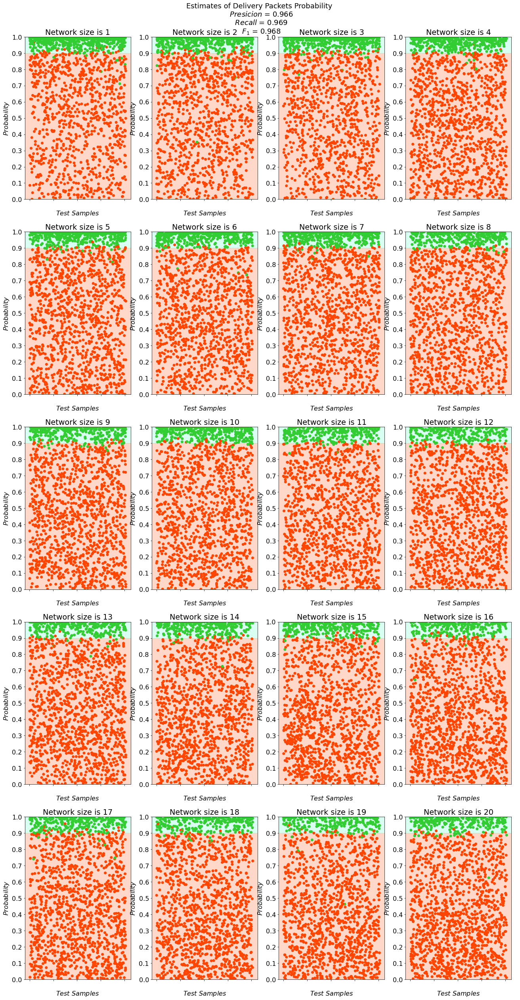

In [221]:
YLIM = [0, 1]
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(22, 40))
fig.suptitle(
    'Estimates of Delivery Packets Probability \n $Presicion$ = {}\n $Recall$ = {}\n $F_1$ = {}'.format(
        catboost_prob_precision_score, 
        catboost_prob_recall_score, 
        catboost_prob_f1_score), 
    fontsize=18)
plt.subplots_adjust(top=0.95)
for i in net_size:
    draw_plot = draw_data.loc[draw_data['NetSize']==i]
    ax = fig.add_subplot(5, 4,  int(i))
    ax.axhspan(0, .9, color='coral', zorder=0, alpha=0.3)
    ax.axhspan(.9, 1, color='aquamarine', zorder=0, alpha=0.3)
    ax.title.set_text('Network size is ' + str(int(i)))    
    plt.ylim(YLIM)

    prob_color = ['limegreen' if i >BOUNDARY else 'orangered' for i in draw_plot['CatBoostProbEst']]
    ax.scatter(draw_plot['TreeDeliveryProbTest'].index, draw_plot['TreeDeliveryProbTest'], 
               color=prob_color)
    plt.xticks(color='w')
    plt.yticks(np.arange(0, 1.1, 0.1))   
    ax.set_xlabel(r'$Test \ Samples$')
    ax.set_ylabel(r'$Probability$')

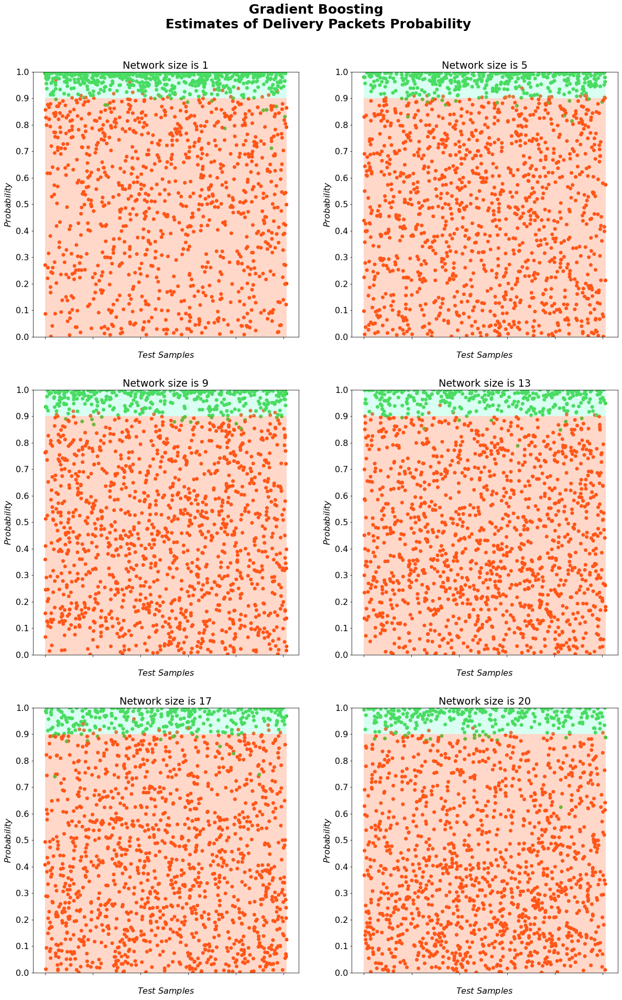

In [223]:
YLIM = [0, 1]
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(20, 30))
# fig.suptitle(r'Estimates of Delivery Packets Probability' + 
#              ' \n $Presicion$ = {}\n $Recall$ = {}\n $F_1$ = {}'.format(
#                 tree_prob_precision_score, 
#                 tree_prob_recall_score, 
#                 tree_prob_f1_score), fontsize=18)
fig.suptitle(r' Gradient Boosting' + 
             ' \n Estimates of Delivery Packets Probability', 
             fontsize=25,
             fontweight='bold')
plt.subplots_adjust(top=0.92)
k = 1
for i in net_size:
    size = [1, 5, 9, 13, 17, 20]
    if i in size:
        draw_plot = draw_data.loc[draw_data['NetSize']==i]
        ax = fig.add_subplot(3, 2,  int(k))

        ax.title.set_text('Network size is ' + str(int(i)))    
        plt.ylim(YLIM)

        prob_color = ['limegreen' if i >BOUNDARY else 'orangered' for i in draw_plot['CatBoostProbEst']]
        ax.scatter(draw_plot['TreeDeliveryProbTest'].index, draw_plot['TreeDeliveryProbTest'], 
                   color=prob_color)
        ax.add_patch(
         patches.Rectangle(
            (0, 0),
            width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
            height=BOUNDARY,
            facecolor = 'coral',
            fill=True,
            alpha=0.3))
        ax.add_patch(
         patches.Rectangle(
            (0, BOUNDARY),
            width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
            height=1 - BOUNDARY,
            facecolor = 'aquamarine',
            fill=True, alpha=0.3))

        plt.xticks(color='w')   
        ax.set_xlabel(r'$Test \ Samples$')
        ax.set_ylabel(r'$Probability$')
        k += 1
        plt.xticks(color='w')
        plt.yticks(np.arange(0, 1.1, 0.1))   
plt.savefig('data/images/catboost_clf_prob.pdf')

Text(0, 0.5, '$Probability$')

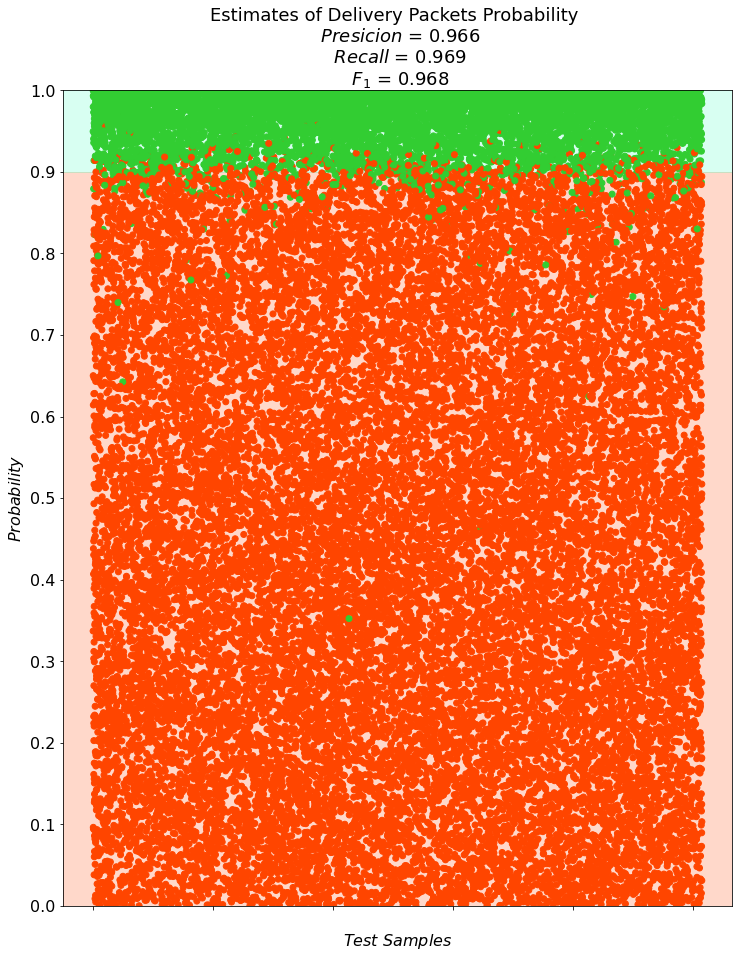

In [220]:
YLIM = [0, 1]
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(12, 15))
plt.title(
    'Estimates of Delivery Packets Probability \n $Presicion$ = {}\n $Recall$ = {}\n $F_1$ = {}'.format(
        catboost_prob_precision_score, 
        catboost_prob_recall_score, 
        catboost_prob_f1_score), 
    fontsize=18)

plt.axhspan(0, .9, color='coral', zorder=0, alpha=0.3)
plt.axhspan(.9, 1, color='aquamarine', zorder=0, alpha=0.3)
ax.title.set_text('Network size is ' + str(int(i)))    
plt.ylim(YLIM)

prob_color = ['limegreen' if i >BOUNDARY else 'orangered' for i in draw_data ['CatBoostProbEst']]
plt.scatter(draw_data ['TreeDeliveryProbTest'].index, draw_data ['TreeDeliveryProbTest'], 
            color=prob_color)
plt.xticks(color='w')
plt.yticks(np.arange(0, 1.1, 0.1))  
plt.xlabel(r'$Test \ Samples$')
plt.ylabel(r'$Probability$')

- ## Модель задачи классификации c помощью логистической регрессии

In [230]:
"""Prepare classification model using Logistic Regression algorithm"""
def get_logress_classif_model(x_train, x_test, 
                              y_train, y_test,
                              boundary=0.9)-> Tuple[np.array, LogisticRegression,
                                                    list, list]: 
    logres_model = LogisticRegression(max_iter=1000)
    binary_train = [1 if i > boundary else 0 for i in y_train]
    binary_test = [1 if i > boundary else 0 for i in y_test]
    logres_model.fit(x_train, binary_train)
    logres_prob_estimate = logres_model.predict(x_test)
    
    return logres_prob_estimate, logres_model, binary_train, binary_test

In [231]:
logres_prob_estimate, logres_model, prob_clf_train, prob_clf_test = get_logress_classif_model(x_train, 
                                                                                x_test, 
                                                                                y_train['DeliveryProb'], 
                                                                                y_test['DeliveryProb'],
                                                                                boundary=BOUNDARY)

logres_prob_precision_score = '{:.3f}'.format(precision_score(prob_clf_test, logres_prob_estimate))
logres_prob_recall_score = '{:.3f}'.format(recall_score(prob_clf_test, logres_prob_estimate))
logres_prob_f1_score = '{:.3f}'.format(f1_score(prob_clf_test, logres_prob_estimate))
print(logres_prob_precision_score)
print(logres_prob_recall_score)
print(logres_prob_f1_score)

0.804
0.821
0.813


In [232]:
draw_data['LogResProbEst'] = logres_prob_estimate

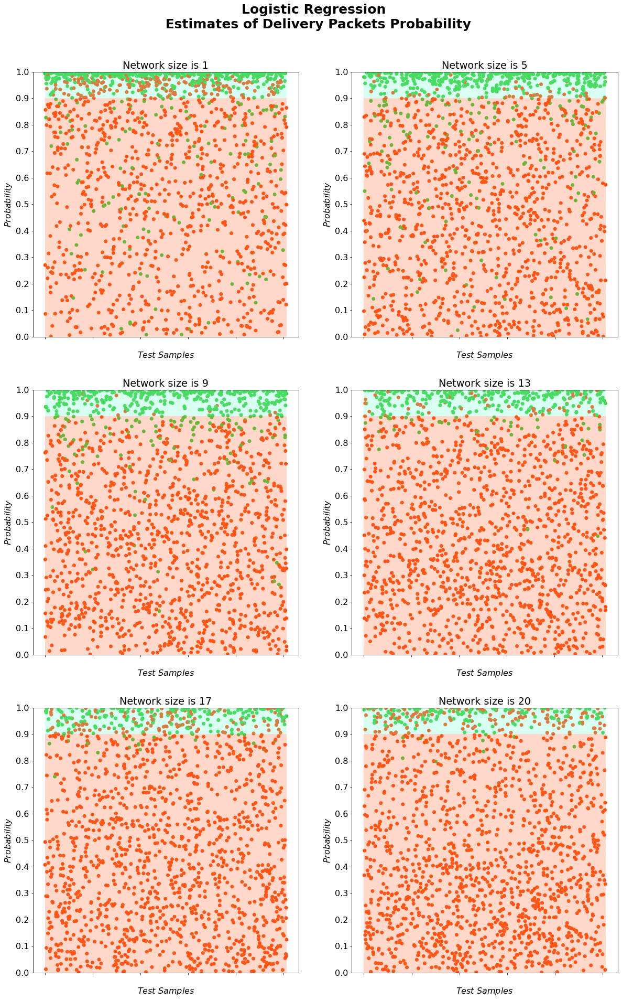

In [233]:
YLIM = [0, 1]
net_size = draw_data['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(20, 30))
# fig.suptitle(r'Estimates of Delivery Packets Probability' + 
#              ' \n $Presicion$ = {}\n $Recall$ = {}\n $F_1$ = {}'.format(
#                 tree_prob_precision_score, 
#                 tree_prob_recall_score, 
#                 tree_prob_f1_score), fontsize=18)
fig.suptitle(r'Logistic Regression' + 
             ' \n Estimates of Delivery Packets Probability', 
             fontsize=25,
             fontweight='bold')
plt.subplots_adjust(top=0.92)
k = 1
for i in net_size:
    size = [1, 5, 9, 13, 17, 20]
    if i in size:
        draw_plot = draw_data.loc[draw_data['NetSize']==i]
        ax = fig.add_subplot(3, 2,  int(k))

        ax.title.set_text('Network size is ' + str(int(i)))    
        plt.ylim(YLIM)

        prob_color = ['limegreen' if i >BOUNDARY else 'orangered' for i in draw_plot['LogResProbEst']]
        ax.scatter(draw_plot['TreeDeliveryProbTest'].index, draw_plot['TreeDeliveryProbTest'], 
                   color=prob_color)
        ax.add_patch(
         patches.Rectangle(
            (0, 0),
            width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
            height=BOUNDARY,
            facecolor = 'coral',
            fill=True,
            alpha=0.3))
        ax.add_patch(
         patches.Rectangle(
            (0, BOUNDARY),
            width=draw_plot.loc[:,'TreeDeliveryProbTest'].index.max(),
            height=1 - BOUNDARY,
            facecolor = 'aquamarine',
            fill=True, alpha=0.3))

        plt.xticks(color='w')   
        ax.set_xlabel(r'$Test \ Samples$')
        ax.set_ylabel(r'$Probability$')
        k += 1
        plt.xticks(color='w')
        plt.yticks(np.arange(0, 1.1, 0.1))   
plt.savefig('data/images/logres_clf_prob.pdf')

Мы получили прогнозные модели времени межконцевой задержки и вероятности доставки пакетов в тандемности сети. Проверим адекватность моделей для тестовох данных:
- для различных коэффициентов загрузок $\rho$;
- для различных длин тандема.

### Оценки времени задержки и вероятность доставки пакетов от коэффициента загрузки

In [447]:
COLUMNS = (
    'ArrM1',
    'ArrM2',
    'ArrM3',
    'ArrAvg', 
    'ArrStd', 
    'ArrCv',
    'ArrSkewness',
    'SrvM1',
    'SrvM2',
    'SrvM3',
    'SrvAvg', 
    'SrvStd', 
    'SrvCv',
    'SrvSkewness', 
    'Rho', 
    'NetSize', 
    'Capacity', 
    'NumPackets',
    'DelayAvg', 
    'DelayStd', 
    'DeliveryProb',
)

arr_m1 = [np.random.uniform(0, 10)]
arr_cv = [np.random.uniform(0.5, 3)]

rho =  np.arange(0.1, 1, 0.05)

srv_cv = [np.random.uniform(0.5, 3)]

net_size = np.arange(1, 20+1)
capacity = [10]


In [448]:
sim_data_rho_netsize = pd.DataFrame(columns=COLUMNS)

In [449]:
REPEAT = False
if REPEAT:
    for _arr_m1, _arr_cv, _rho, \
        _srv_cv, _net_size, _capacity in tqdm(product(arr_m1, arr_cv, \
            rho, srv_cv, net_size, capacity)):

            _arr_skewness = np.random.uniform(_arr_cv - 1/_arr_cv, 100)
            _srv_m1 = _rho * _arr_m1
            _srv_skewness = np.random.uniform(_srv_cv - 1/_srv_cv, 100)

            sim_data_rho_netsize = simulate(
                sim_data_rho_netsize,
                arr_m1=_arr_m1,
                arr_m2=get_noncentral_m2(_arr_m1, _arr_cv),
                arr_m3=get_noncentral_m3(_arr_m1, _arr_cv, _arr_skewness),
                srv_m1=_srv_m1,
                srv_m2=get_noncentral_m2(_srv_m1, _srv_cv),
                srv_m3=get_noncentral_m3(_srv_m1, _srv_cv, _srv_skewness),
                net_size=_net_size,
                capacity=_capacity,
                num_packets=NUM_PACKETS,
                force=FORCE_SIMULATION
            )

    print(sim_data_rho_netsize.info())
    print(sim_data_rho_netsize)

    sim_data_rho_netsize.to_csv('./data/Tandem_network_data_with_different_rho_and_netsize.csv')

In [450]:
sim_data_rho_netsize = pd.read_csv('./data/Tandem_network_data_with_different_rho_and_netsize.csv')

In [451]:
sim_data_rho_netsize

,Unnamed: 0,ArrM1,ArrM2,ArrM3,ArrAvg,ArrStd,ArrCv,ArrSkewness,SrvM1,SrvM2,...,SrvStd,SrvCv,SrvSkewness,Rho,NetSize,Capacity,NumPackets,DelayAvg,DelayStd,DeliveryProb
0,0,3.118068,53.868823,10503.772498,3.118068,6.644282,2.130897,34.298536,0.311807,0.227441,...,0.360857,1.157309,46.167953,0.10,1.0,10.0,100000.0,0.349224,0.459648,0.999960
1,1,3.118068,53.868823,10678.575047,3.118068,6.644282,2.130897,34.894477,0.311807,0.227441,...,0.360857,1.157309,66.021954,0.10,2.0,10.0,100000.0,0.692176,0.491404,1.000000
2,2,3.118068,53.868823,29422.156524,3.118068,6.644282,2.130897,98.795600,0.311807,0.227441,...,0.360857,1.157309,23.752713,0.10,3.0,10.0,100000.0,1.048508,0.741787,1.000000
3,3,3.118068,53.868823,26492.152070,3.118068,6.644282,2.130897,88.806550,0.311807,0.227441,...,0.360857,1.157309,10.648238,0.10,4.0,10.0,100000.0,1.413131,0.904174,1.000000
4,4,3.118068,53.868823,16259.587793,3.118068,6.644282,2.130897,53.921416,0.311807,0.227441,...,0.360857,1.157309,35.076870,0.10,5.0,10.0,100000.0,1.778295,1.426822,0.999530
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,355,3.118068,53.868823,25356.164950,3.118068,6.644282,2.130897,84.933712,2.962164,20.526556,...,3.428139,1.157309,7.528846,0.95,16.0,10.0,100000.0,187.222339,29.190773,0.685192
356,356,3.118068,53.868823,10554.840982,3.118068,6.644282,2.130897,34.472640,2.962164,20.526556,...,3.428139,1.157309,34.446498,0.95,17.0,10.0,100000.0,196.715824,34.178454,0.718511
357,357,3.118068,53.868823,26047.251678,3.118068,6.644282,2.130897,87.289784,2.962164,20.526556,...,3.428139,1.157309,66.418507,0.95,18.0,10.0,100000.0,207.131149,32.082384,0.739276
358,358,3.118068,53.868823,20119.559926,3.118068,6.644282,2.130897,67.080937,2.962164,20.526556,...,3.428139,1.157309,72.915726,0.95,19.0,10.0,100000.0,216.934845,38.329696,0.727582


In [452]:
COLUMNS = [
    'ArrM1',
    'ArrM2',
    'ArrM3',
    'SrvM1',
    'SrvM2',
    'SrvM3',
    'NetSize', 
    'Capacity',
    ]
x_test_rho_netsize = sim_data_rho_netsize.loc[:, COLUMNS]
x_test_rho_netsize
y_test_delay = sim_data_rho_netsize['DelayAvg']
y_test_prob = sim_data_rho_netsize['DeliveryProb']

In [453]:
def get_regression_metrics(test, estimate) -> Tuple[float, float, float]:
    r = corr(test, estimate)
    _std = std(test, estimate)
    mse = mean_squared_error(test, estimate)
    return r, _std, mse

In [454]:
def get_classification_metrics(test, estimate) -> Tuple[float, float, float]:
    precision = precision_score(test, estimate)
    recall = recall_score(test, estimate)
    f1 = f1_score(test, estimate)
    return precision, recall, f1

In [171]:
ls_rho_netsize_estimate = ls.predict(x_test_rho_netsize)
R, STD, MSE = get_regression_metrics(y_test_delay, ls_rho_netsize_estimate)
print(f'R = {R:.3f}')
print(f'STD = {STD:.3f}')
print(f'MSE = {MSE:.3f}')
sim_data_rho_netsize['ls_estimate'] = ls_rho_netsize_estimate

R = 0.729
STD = 77.793
MSE = 6034.991


In [172]:
tree_rho_netsize_estimate = tree_reg.predict(x_test_rho_netsize)
R, STD, MSE = get_regression_metrics(y_test_delay, tree_rho_netsize_estimate)
print(f'R = {R:.3f}')
print(f'STD = {STD:.3f}')
print(f'MSE = {MSE:.3f}')
sim_data_rho_netsize['tree_estimate'] = tree_rho_netsize_estimate

R = 0.979
STD = 10.704
MSE = 114.263


In [251]:
gtb_rho_netsize_estimate = gtb.predict(x_test_rho_netsize)
R, STD, MSE = get_regression_metrics(y_test_delay, gtb_rho_netsize_estimate)
print(f'R = {R:.3f}')
print(f'STD = {STD:.3f}')
print(f'MSE = {MSE:.3f}')
sim_data_rho_netsize['gtb_estimate'] = gtb_rho_netsize_estimate

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 9625 and the array at index 1 has size 360

In [250]:
test_normalize = normalize(x_test_rho_netsize, 
                           simulation_data.loc[:,COLUMNS].describe())
ann_rho_netsize_estimate = ann.predict(test_normalize).flatten()
R, STD, MSE = get_regression_metrics(y_test_delay, ann_rho_netsize_estimate)
print(f'R = {R:.3f}')
print(f'STD = {STD:.3f}')
print(f'MSE = {MSE:.3f}')
sim_data_rho_netsize['ann_estimate'] = ann_rho_netsize_estimate

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 9625 and the array at index 1 has size 360

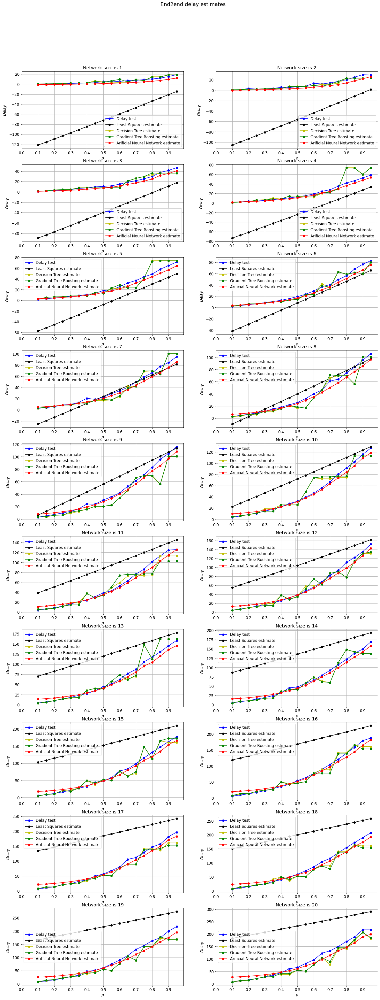

In [68]:
net_size = sim_data_rho_netsize['NetSize'].unique()
net_size.sort()
fig = plt.figure(figsize=(20, 50))
fig.suptitle('End2end delay estimates \n', fontsize=16)
plt.subplots_adjust(top=0.92)
for i in net_size:
    draw = sim_data_rho_netsize.loc[sim_data_rho_netsize['NetSize']==i]
    ax = fig.add_subplot(10, 2, int(i))
    ax.title.set_text('Network size is ' + str(int(i)))    
    plt.plot(draw['Rho'], draw['DelayAvg'], '-bo', label='Delay test')
    plt.plot(draw['Rho'], draw['ls_estimate'], '-ko', label='Least Squares estimate')
    plt.plot(draw['Rho'], draw['tree_estimate'], '-yo', label='Decision Tree estimate')
    plt.plot(draw['Rho'], draw['gtb_estimate'], '-go', label='Gradient Tree Boosting estimate')
    plt.plot(draw['Rho'], draw['ann_estimate'], '-ro', label='Artificial Neural Network estimate')
    plt.xticks(np.arange(0, 1, 0.1))  
    plt.legend()
    plt.grid()
    plt.xlabel(r'$\rho$')
    plt.ylabel(r'$Delay$')

Text(0, 0.5, '$Delay$')

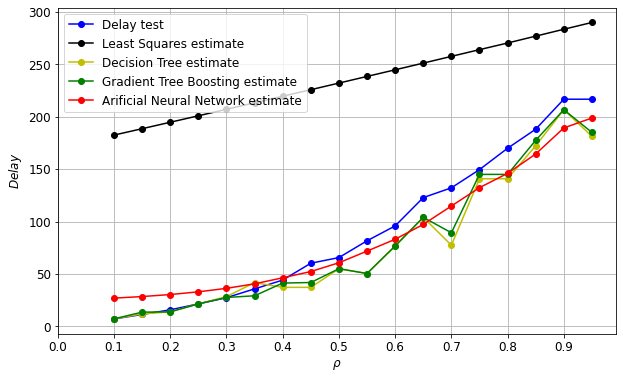

In [79]:
i=20
draw = sim_data_rho_netsize.loc[sim_data_rho_netsize['NetSize']==i]
plt.figure(figsize=(10, 6))
ax.title.set_text('Network size is ' + str(int(i)))    
plt.plot(draw['Rho'], draw['DelayAvg'], '-bo', label='Delay test')
plt.plot(draw['Rho'], draw['ls_estimate'], '-ko', label='Least Squares estimate')
plt.plot(draw['Rho'], draw['tree_estimate'], '-yo', label='Decision Tree estimate')
plt.plot(draw['Rho'], draw['gtb_estimate'], '-go', label='Gradient Tree Boosting estimate')
plt.plot(draw['Rho'], draw['ann_estimate'], '-ro', label='Artificial Neural Network estimate')
plt.xticks(np.arange(0, 1, 0.1))  
plt.legend()
plt.grid()
plt.xlabel(r'$\rho$')
plt.ylabel(r'$Delay$')

In [516]:
COLUMNS = [
    'ArrM1',
    'ArrM2',
    'ArrM3',
    'SrvM1',
    'SrvM2',
    'SrvM3',
    'NetSize', 
    'Capacity',
    ]

BOUNDARY = 0.9

r_model = {'liner_regresson': ls,
           'decision_tree': tree_reg, 
           'gradient_boosting': gtb,
           'neural_network': ann}
r_metrics_column = ['Model', 'R', 'STD', 'MSE', 
                    'Portion', 'NumSamples']
c_model = {'logistic_regression': logres_model,
            'decision_tree': tree_clf,
            'neural_network': mlpc_clf, 
            'cat_boost': catboost_clf}
c_metrics_column = ['Model', 'Precision', 'Recall', 'F1', 
                    'Portion', 'NumSamples']
r_metrics = pd.DataFrame(
    np.zeros([len(data_portion)*len(r_model), len(r_metrics_column)]), 
    columns=r_metrics_column)
c_metrics = pd.DataFrame(
    np.zeros([len(data_portion)*len(c_model), len(c_metrics_column)]), 
    columns=c_metrics_column)

c_index=0
r_index=0

def write_metrics(df: pd.DataFrame, j:int, 
                  model_name:str, portion:float, samples: int, 
                  regress: Tuple[float,float, float]=tuple(), 
                  classification: Tuple[float, float, float]=tuple()) -> Tuple[pd.DataFrame, int]:
    if len(classification) == 0:
        df.loc[j, 'Model'] = model_name
        df.loc[j, 'R'] = regress[0]
        df.loc[j, 'STD'] = regress[1]
        df.loc[j, 'MSE'] = regress[2]
        df.loc[j, 'Portion'] = portion
        df.loc[j, 'NumSamples'] =  count
    else:
        df.loc[j, 'Model'] = model_name
        df.loc[j, 'Precision'] = classification[0]
        df.loc[j, 'Recall'] = classification[1]
        df.loc[j, 'F1'] = classification[2]
        df.loc[j, 'Portion'] = portion
        df.loc[j, 'NumSamples'] =  count

    return df, j+1
    

In [582]:
def get_average_metrics(model, x_test, y_test, task, 
                        ann_test=None, n=1000) -> Tuple[float, float, float]:
    metric1 = np.zeros(n)
    metric2 = np.zeros(n)
    metric3 = np.zeros(n)

    for i in range(n):
        if ann_test is not None:
            estimate = model.predict(ann_test).flatten()
        else:
            estimate = model.predict(x_test)
        if task == 'regression':
            metric1[i], metric2[i], metric3[i] = get_regression_metrics(y_test, 
                                                                        estimate)
        if task == 'classification':
            metric1[i], metric2[i], metric3[i] = get_classification_metrics(y_test, 
                                                                            estimate)

    return metric1.mean(), metric2.mean(), metric3.mean()

In [520]:
sim_data_rho_netsize = pd.read_csv('./data/Tandem_network_data_with_different_rho_and_netsize.csv')
x_test = sim_data_rho_netsize.loc[:, COLUMNS]
y_test = sim_data_rho_netsize.loc[:, ['DelayAvg', 'DeliveryProb']]

In [583]:
sim_data_rho_netsize = pd.read_csv('./data/Tandem_network_data_with_different_rho_and_netsize.csv')
sim_x_test = sim_data_rho_netsize.loc[:, COLUMNS]
sim_y_test = sim_data_rho_netsize.loc[:, ['DelayAvg', 'DeliveryProb']]

data = pd.read_csv('data/Tandem_network_with_ph_distribution.csv', index_col='Id')
data = data[data['Rho'] <= 10]

data_portion = [.001, .005, .01, .02, .03, .04, .05, .1, .2, .3, .4, .5, .6, .7, .75, .8, .85, .9, .93, .96, 1]
# data_portion = [.1, .2, .9]
r_metrics = pd.DataFrame(
    np.zeros([len(data_portion)*len(r_model), len(r_metrics_column)]), 
    columns=r_metrics_column)
c_metrics = pd.DataFrame(
    np.zeros([len(data_portion)*len(c_model), len(c_metrics_column)]), 
    columns=c_metrics_column)

c_index=0
r_index=0

for portion in tqdm(data_portion):
    count = round(len(data.index)*portion)
    row = random.sample(list(data.index), count)
    sim = data.loc[row, :]
    
    sim_x_train = sim.loc[:, COLUMNS]
    sim_y_train = sim.loc[:, ['DelayAvg', 'DeliveryProb']]


    #  REGRESSION
    # linear regression
    _, ls = get_ls_regression_model(sim_x_train, sim_x_test, 
                                    sim_y_train['DelayAvg'], 
                                    sim_y_test['DelayAvg'])
    R, STD, MSE = get_average_metrics(ls, sim_x_test, 
                                      sim_y_test['DelayAvg'], 
                                      task='regression')
    r_metrics, r_index = write_metrics(r_metrics, r_index, 
                                       'linear_regresson', 
                                       portion, count, 
                                       regress=(R, STD, MSE))
    # decision tree
    _, tree_reg = get_tree_regression_model(sim_x_train, sim_x_test, 
                                            sim_y_train['DelayAvg'], 
                                            sim_y_test['DelayAvg'])
    R, STD, MSE = get_average_metrics(tree_reg, sim_x_test, 
                                      sim_y_test['DelayAvg'], 
                                      task='regression')
    r_metrics, r_index = write_metrics(r_metrics, r_index, 
                                       'decision_tree', 
                                       portion, count, 
                                       regress=(R, STD, MSE))
    # gradient boosting
    _, gtb = get_tree_regression_model(sim_x_train, sim_x_test, 
                                       sim_y_train['DelayAvg'], 
                                       sim_y_test['DelayAvg'])
    R, STD, MSE = get_average_metrics(gtb, sim_x_test, 
                                      sim_y_test['DelayAvg'], 
                                      task='regression')
    r_metrics, r_index = write_metrics(r_metrics, r_index, 
                                       'gradient_boosting', 
                                       portion, count, 
                                       regress=(R, STD, MSE))
    # artificial neural network
    sim_train_normalize = normalize(sim_x_train, data.loc[:,COLUMNS].describe())
    sim_train_normalize.to_numpy();
    sim_test_normalize = normalize(sim_x_test, data.loc[:,COLUMNS].describe())
    sim_test_normalize.to_numpy();
    _, ann = get_ann_regression_model(sim_train_normalize, sim_test_normalize,
                                      sim_y_train['DelayAvg'], sim_y_test['DelayAvg'],
                                      size=len(sim.loc[:,COLUMNS].keys()))
    R, STD, MSE = get_average_metrics(ann, sim_x_test, 
                                      sim_y_test['DelayAvg'], 
                                      task='regression',
                                      ann_test=sim_test_normalize)
    r_metrics, r_index = write_metrics(r_metrics, r_index, 
                                       'neural_network', 
                                       portion, count, 
                                       regress=(R, STD, MSE))
    
    
    # CLASSIFICATION
    # Logistic regression
    _, logres_model, _, prob_clf_test = get_logress_classif_model(
        sim_x_train, sim_x_test, 
        sim_y_train['DeliveryProb'], 
        sim_y_test['DeliveryProb'],
        boundary=BOUNDARY)

    precision, recall, f1 = get_average_metrics(logres_model, sim_x_test, 
                                                prob_clf_test, task='classification')
    c_metrics, c_index = write_metrics(c_metrics, c_index, 
                                       'logistic_regression', 
                                       portion, count, 
                                       classification=(precision, recall, f1))

    # Decision tree
    _, tree_clf, _, prob_clf_test = get_tree_classif_model(sim_x_train, 
                                                           sim_x_test, 
                                                           sim_y_train['DeliveryProb'], 
                                                           sim_y_test['DeliveryProb'])

    precision, recall, f1 = get_average_metrics(tree_clf, sim_x_test, 
                                                prob_clf_test, task='classification')

    c_metrics, c_index = write_metrics(c_metrics, c_index, 
                                       'decision_tree', 
                                       portion, count, 
                                       classification=(precision, recall, f1))
    # Neural network
    _, mlpc_clf, _, prob_clf_test = get_mlp_classif_model(sim_x_train, 
                                                          sim_x_test, 
                                                          sim_y_train['DeliveryProb'], 
                                                          sim_y_test['DeliveryProb'],
                                                          boundary=BOUNDARY, 
                                                          hidden_layer_sizes=(54, 54))
     
    precision, recall, f1 = get_average_metrics(mlpc_clf, sim_x_test, 
                                                prob_clf_test, task='classification')

    c_metrics, c_index = write_metrics(c_metrics, c_index, 
                                       'neural_network', 
                                       portion, count, 
                                       classification=(precision, recall, f1))
    
    # Cat Boost
    _, catboost_clf, _, prob_clf_test = get_catboost_classif_model(sim_x_train, 
                                                                   sim_x_test, 
                                                                   sim_y_train['DeliveryProb'], 
                                                                   sim_y_test['DeliveryProb'])
    
    precision, recall, f1 = get_average_metrics(catboost_clf, sim_x_test, 
                                                prob_clf_test, task='classification')

    c_metrics, c_index = write_metrics(c_metrics, c_index, 
                                       'cat_boost', 
                                       portion, count, 
                                       classification=(precision, recall, f1))                                   

r_metrics.to_csv('./data/Regression_metrics.csv')
c_metrics.to_csv('./data/Classification_metrics.csv')


  0%|          | 0/21 [00:00<?, ?it/s]

In [648]:
r_metrics = pd.read_csv('./data/Regression_metrics.csv')
c_metrics = pd.read_csv('./data/Classification_metrics.csv')

In [649]:
r_metrics

,Unnamed: 0,Model,R,STD,MSE,Portion,NumSamples
0,0,linear_regresson,0.709445,89.760927,8034.643306,0.001,96.0
1,1,decision_tree,0.778778,35.683900,1269.803678,0.001,96.0
2,2,gradient_boosting,0.736173,38.336849,1465.631484,0.001,96.0
3,3,neural_network,0.915542,22.438722,502.097644,0.001,96.0
4,4,linear_regresson,0.717348,82.906062,6854.322244,0.005,481.0
...,...,...,...,...,...,...,...
79,79,neural_network,0.995313,13.887406,192.324332,0.960,92398.0
80,80,linear_regresson,0.728082,77.782749,6033.350081,1.000,96248.0
81,81,decision_tree,0.970958,13.400486,179.074223,1.000,96248.0
82,82,gradient_boosting,0.968722,13.932795,193.583550,1.000,96248.0


In [650]:
c_metrics

,Unnamed: 0,Model,Precision,Recall,F1,Portion,NumSamples
0,0,logistic_regression,0.919192,0.330909,0.486631,0.001,96.0
1,1,decision_tree,0.763889,1.000000,0.866142,0.001,96.0
2,2,neural_network,0.888430,0.781818,0.831721,0.001,96.0
3,3,cat_boost,0.763889,1.000000,0.866142,0.001,96.0
4,4,logistic_regression,0.990431,0.752727,0.855372,0.005,481.0
...,...,...,...,...,...,...,...
79,79,cat_boost,0.966667,0.949091,0.957798,0.960,92398.0
80,80,logistic_regression,0.991416,0.840000,0.909449,1.000,96248.0
81,81,decision_tree,0.991968,0.898182,0.942748,1.000,96248.0
82,82,neural_network,0.794798,1.000000,0.885668,1.000,96248.0


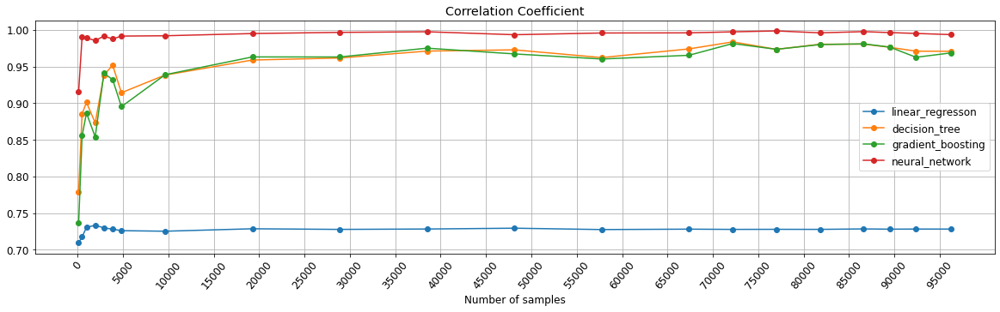

In [675]:
plt.figure(figsize=(20, 5))
for i in r_metrics['Model'].unique(): 
    plt.title('Correlation Coefficient');
    draw_r_metrics = r_metrics.loc[r_metrics['Model']==i]
    plt.plot(draw_r_metrics.loc[:,'NumSamples'], draw_r_metrics.loc[:,'R'], '-o', label=i)
plt.legend()
plt.grid()
plt.xlabel('Number of samples');
plt.xticks(np.arange(0, draw_r_metrics['NumSamples'].iloc[-1], step=5000), rotation=50);
    
    

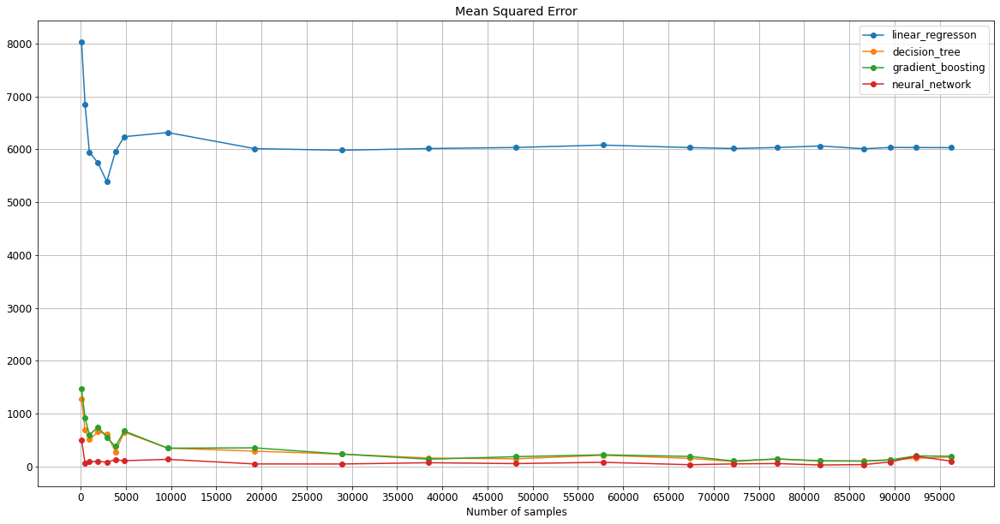

In [676]:
plt.figure(figsize=(20, 10))
for i in r_metrics['Model'].unique(): 
    plt.title('Mean Squared Error');
    draw_r_metrics = r_metrics.loc[r_metrics['Model']==i]
    plt.plot(draw_r_metrics.loc[:,'NumSamples'], draw_r_metrics.loc[:,'MSE'], '-o', label=i)
plt.legend()
plt.grid()
plt.xlabel('Number of samples');
plt.xticks(np.arange(0, draw_r_metrics['NumSamples'].iloc[-1], step=5000));

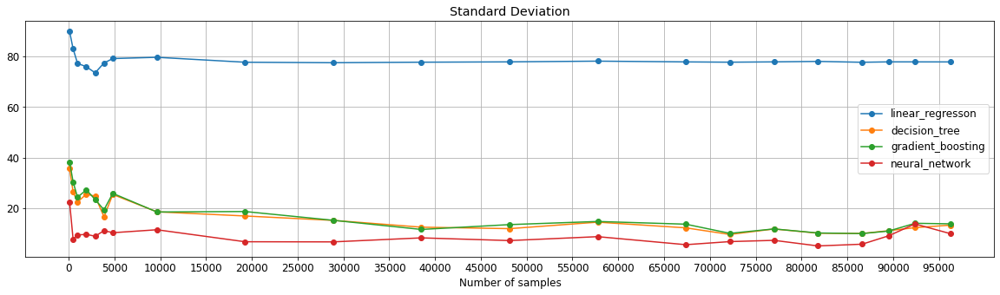

In [677]:
plt.figure(figsize=(20, 5))
for i in r_metrics['Model'].unique(): 
    plt.title('Standard Deviation');
    draw_r_metrics = r_metrics.loc[r_metrics['Model']==i]
    plt.plot(draw_r_metrics.loc[:,'NumSamples'], draw_r_metrics.loc[:,'STD'], '-o', label=i)
plt.legend()
plt.grid()
plt.xlabel('Number of samples');
plt.xticks(np.arange(0, draw_r_metrics['NumSamples'].iloc[-1], step=5000));

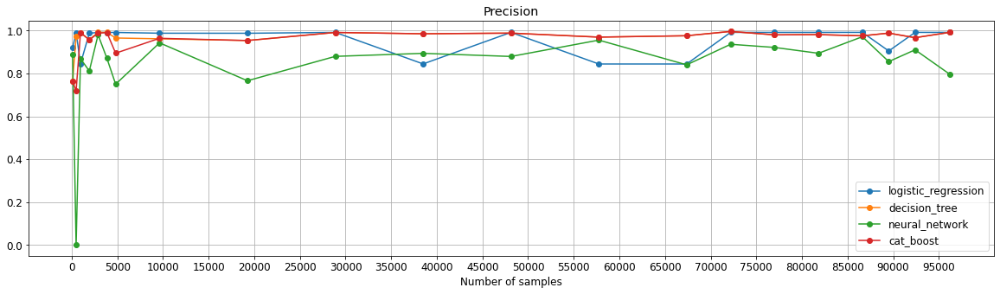

In [688]:
plt.figure(figsize=(20, 5))
for i in c_metrics['Model'].unique(): 
    plt.title('Precision');
    draw_c_metrics = c_metrics.loc[c_metrics['Model']==i]
    plt.plot(draw_c_metrics.loc[:,'NumSamples'], draw_c_metrics.loc[:,'Precision'], '-o', label=i)
plt.legend()
plt.grid()
plt.xlabel('Number of samples');
plt.xticks(np.arange(0, draw_c_metrics['NumSamples'].iloc[-1], step=5000));

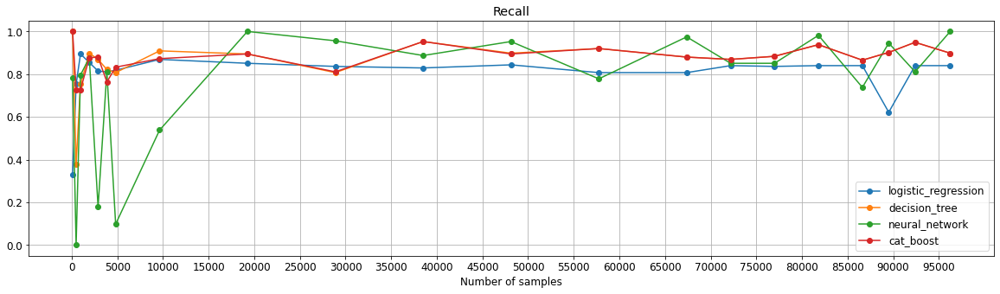

In [689]:
plt.figure(figsize=(20, 5))
for i in c_metrics['Model'].unique(): 
    plt.title('Recall');
    draw_c_metrics = c_metrics.loc[c_metrics['Model']==i]
    plt.plot(draw_c_metrics.loc[:,'NumSamples'], draw_c_metrics.loc[:,'Recall'], '-o', label=i)
plt.legend()
plt.grid()
plt.xlabel('Number of samples');
plt.xticks(np.arange(0, draw_c_metrics['NumSamples'].iloc[-1], step=5000));

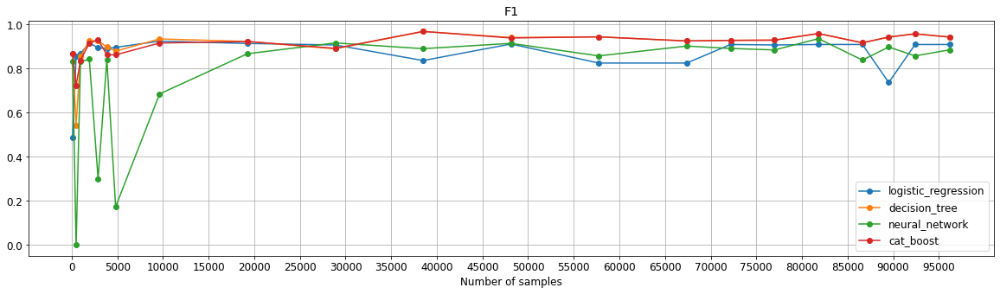

In [690]:
plt.figure(figsize=(20, 5))
for i in c_metrics['Model'].unique(): 
    plt.title('F1');
    draw_c_metrics = c_metrics.loc[c_metrics['Model']==i]
    plt.plot(draw_c_metrics.loc[:,'NumSamples'], draw_c_metrics.loc[:,'F1'], '-o', label=i)
plt.legend()
plt.grid()
plt.xlabel('Number of samples');
plt.xticks(np.arange(0, draw_c_metrics['NumSamples'].iloc[-1], step=5000));